# Downscaling of SIF760 and SIF687

In [33]:
import geopandas as gpd
import rioxarray
import rasterio
from rasterio import features
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import xarray as xr
import os
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from spectral import envi
from shapely.geometry import box
from rasterio.transform import rowcol
from matplotlib.lines import Line2D
from scipy.stats import gaussian_kde
from matplotlib_scalebar.scalebar import ScaleBar

In [34]:
os.chdir("E:/Pfynwald/")

In [35]:
# Main processing functions

def load_wavelengths(hdr_path):
    hdr = envi.read_envi_header(hdr_path)
    return [float(w) for w in hdr['wavelength']]

def open_and_scale(filepath):
    cube = rioxarray.open_rasterio(filepath).astype('float32')  # ensure float
    # mask out-of-range and fill values
    cube = cube.where((cube >= 0) & (cube <= REFL_SCALE) & (cube != FILL_VALUE))
    # scale to 0..1
    cube = cube / REFL_SCALE
    return cube

def with_crs_preserved(func, arr, *args, **kwargs):
    """
    Apply an xarray function to `arr` while preserving CRS metadata.
    """
    result = func(arr, *args, **kwargs)
    if hasattr(arr.rio, 'crs') and arr.rio.crs is not None:
        result.rio.write_crs(arr.rio.crs, inplace=True)
    return result

def compute_mean_reflectance(cube, wavelengths, ranges):
    
    results = {}

    for name, (low, high) in ranges.items():
        # Find indices of wavelengths within range
        idx = [i for i, wl in enumerate(wavelengths) if low <= wl <= high]

        # If no bands found, pick the nearest band
        if len(idx) == 0:
            center = 0.5 * (low + high)
            nearest = np.argmin(np.abs(np.array(wavelengths) - center))
            idx = [nearest]

        # Select bands by position (not coordinate value) and take mean
        da = cube.isel(band=idx).mean(dim="band")
        results[name] = da

    return results

def process_month_indices(raster_files, wavelengths, ndvi_threshold=0.5, fcvi_threshold=0.18):
    red_list, nir_list, vis_list, nir_fcvi_list, wdrvi_list = [], [], [], [], []
    ndvi_list, nirv_list, fcvi_list, saR2F_list = [], [], [], []
    fapar_green_list, fapar_chl_list = [], []
    fesc_sif760_fcvi_list, fesc_sif760_nirv_list, fesc_saR2F_list = [], [], []
    ref = None

    for i, (label, filepath) in enumerate(raster_files.items()):
        cube = open_and_scale(filepath)
        refl = compute_mean_reflectance(
            cube,
            wavelengths,
            {
                "red": RED_RANGE,
                "nir": NIR_RANGE,
                "vis": VIS_RANGE,
                "nir_fcvi": NIR_FCVI_RANGE,
                "mtci_nir": MTCI_NIR_RANGE,
                "mtci_re": MTCI_REDEDGE_RANGE,
                "mtci_red": MTCI_RED_RANGE,
                "nir_saR2F": NIR_saR2F_RANGE,
                "red_saR2F": RED_saR2F_RANGE,
                "blue_saR2F": BLUE_saR2F_RANGE,
            }
        )

        # --- Replace invalid/fill values with NaN ---
        for key in refl:
            refl[key] = refl[key].where(refl[key] > 0)

        # NDVI
        ndvi = (refl["nir"] - refl["red"]) / (refl["nir"] + refl["red"])

        # NIRv
        nirv = ndvi * refl["nir"]

        # FCVI
        fcvi = refl["nir_fcvi"] - refl["vis"]

        # saR2F
        saR2F = refl["nir_saR2F"] - 1.4 * refl["red_saR2F"] + 0.4 * refl["blue_saR2F"]

        # WDRVI
        wdrvi = (0.1 * refl["nir"] - refl["red"]) / (0.1 * refl["nir"] + refl["red"])

        # fAPARgreen and fAPARchl
        fapar_green = 0.516 * wdrvi + 0.726
        fapar_chl   = 0.79  * fapar_green

        # fesc for SIF760 calculated with NIRv
        fesc_sif760_nirv = xr.where(
            (ndvi >= ndvi_threshold),
            nirv / fapar_chl,
            np.nan
        )

        # fesc for SIF760 calculated with FCVI
        fesc_sif760_fcvi = xr.where(
            (ndvi >= ndvi_threshold), #& (fcvi >= fcvi_threshold)
            fcvi / fapar_chl,
            np.nan
        )

        # fesc for SIF760 calculated with FCVI
        fesc_sif760_saR2F = xr.where(
            (ndvi >= ndvi_threshold), #& (fcvi >= fcvi_threshold)
            saR2F / fapar_chl,
            np.nan
        )

        # optionally add sqr of MTCI, for low chlorophyll concentrations <
        '''mtci = (refl["mtci_nir"] - refl["mtci_re"]) / (refl["mtci_re"] - refl["mtci_red"])
        mtci_safe = mtci.where(mtci > 0)  # mask negative/zero before sqrt
        fesc_sif687 = xr.where(
            (ndvi >= ndvi_threshold) & (mtci_safe.notnull()),
            (refl["red"] * (nirv ** 2)) / np.sqrt(mtci_safe) / fapar_chl,
            np.nan
        )'''


        # --- Assign CRS if missing ---
        if i == 0:
            ref = refl["red"]
            if ref.rio.crs is None:
                ref.rio.write_crs("EPSG:XXXX", inplace=True)
        else:
            # Copy CRS from ref to all derived arrays
            for arr in [ndvi, nirv, fcvi, saR2F, wdrvi, fapar_green, fapar_chl, fesc_sif760_nirv, fesc_sif760_fcvi, fesc_sif760_saR2F]:
                if arr.rio.crs is None:
                    arr.rio.write_crs(ref.rio.crs, inplace=True)

            # Reproject all bands and derived arrays
            for key in refl:
                refl[key] = refl[key].rio.reproject_match(ref)
            ndvi = ndvi.rio.reproject_match(ref)
            nirv = nirv.rio.reproject_match(ref)
            fcvi = fcvi.rio.reproject_match(ref)
            saR2F = saR2F.rio.reproject_match(ref)
            wdrvi = wdrvi.rio.reproject_match(ref)
            fapar_green = fapar_green.rio.reproject_match(ref)
            fapar_chl = fapar_chl.rio.reproject_match(ref)
            fesc_sif760_nirv = fesc_sif760_nirv.rio.reproject_match(ref)
            fesc_sif760_fcvi = fesc_sif760_fcvi.rio.reproject_match(ref)
            fesc_sif760_saR2F = fesc_sif760_saR2F.rio.reproject_match(ref)

        # --- Apply NDVI mask ---
        mask = ndvi >= ndvi_threshold
        for key in refl:
            refl[key] = refl[key].where(mask)
        ndvi = ndvi.where(mask)
        nirv = nirv.where(mask)
        fcvi = fcvi.where(mask)
        saR2F = saR2F.where(mask)
        wdrvi = wdrvi.where(mask)
        fapar_green = fapar_green.where(mask)
        fapar_chl = fapar_chl.where(mask)
        fesc_sif760_nirv = fesc_sif760_nirv.where(mask)
        fesc_sif760_fcvi = fesc_sif760_fcvi.where(mask)
        fesc_sif760_saR2F = fesc_sif760_saR2F.where(mask)

        # --- Append to lists ---
        red_list.append(refl["red"])
        nir_list.append(refl["nir"])
        vis_list.append(refl["vis"])
        nir_fcvi_list.append(refl["nir_fcvi"])
        ndvi_list.append(ndvi)
        nirv_list.append(nirv)
        saR2F_list.append(saR2F)
        fcvi_list.append(fcvi)
        wdrvi_list.append(wdrvi)
        fapar_green_list.append(fapar_green)
        fapar_chl_list.append(fapar_chl)
        fesc_sif760_nirv_list.append(fesc_sif760_nirv)
        fesc_sif760_fcvi_list.append(fesc_sif760_fcvi)
        fesc_saR2F_list.append(fesc_sif760_saR2F)

    # --- Compute mean across scenes ---
    return {
        "Rred": xr.concat(red_list, dim="scene").mean(dim="scene"),
        "Rnir": xr.concat(nir_list, dim="scene").mean(dim="scene"),
        "Rvis": xr.concat(vis_list, dim="scene").mean(dim="scene"),
        "Rnir_fcvi": xr.concat(nir_fcvi_list, dim="scene").mean(dim="scene"),
        "NDVI": xr.concat(ndvi_list, dim="scene").mean(dim="scene"),
        "NIRv": xr.concat(nirv_list, dim="scene").mean(dim="scene"),
        "FCVI": xr.concat(fcvi_list, dim="scene").mean(dim="scene"),
        "saR2F": xr.concat(saR2F_list, dim="scene").mean(dim="scene"),
        "WDRVI": xr.concat(wdrvi_list, dim="scene").mean(dim="scene"),
        "fAPARgreen": xr.concat(fapar_green_list, dim="scene").mean(dim="scene"),
        "fAPARchl": xr.concat(fapar_chl_list, dim="scene").mean(dim="scene"),
        "fesc_SIF760_NIRv": xr.concat(fesc_sif760_nirv_list, dim="scene").mean(dim="scene"),
        "fesc_SIF760_FCVI": xr.concat(fesc_sif760_fcvi_list, dim="scene").mean(dim="scene"),
        "fesc_SIF760_saR2F": xr.concat(fesc_saR2F_list, dim="scene").mean(dim="scene")
    }

    # --- Optionally, compute max across scenes ---
    '''return {
        "Rred": xr.concat(red_list, dim="scene").max(dim="scene"),
        "Rnir": xr.concat(nir_list, dim="scene").max(dim="scene"),
        "Rvis": xr.concat(vis_list, dim="scene").max(dim="scene"),
        "Rnir_fcvi": xr.concat(nir_fcvi_list, dim="scene").max(dim="scene"),
        "NDVI": xr.concat(ndvi_list, dim="scene").max(dim="scene"),
        "NIRv": xr.concat(nirv_list, dim="scene").max(dim="scene"),
        "FCVI": xr.concat(fcvi_list, dim="scene").max(dim="scene"),
        "WDRVI": xr.concat(wdrvi_list, dim="scene").max(dim="scene"),
        "fAPARgreen": xr.concat(fapar_green_list, dim="scene").max(dim="scene"),
        "fAPARchl": xr.concat(fapar_chl_list, dim="scene").max(dim="scene"),
        "fesc_SIF760": xr.concat(fesc_sif760_list, dim="scene").max(dim="scene"),
        "fesc_SIF687": xr.concat(fesc_sif687_list, dim="scene").max(dim="scene"),
    }'''

def get_pixels_by_treatment_weighted(rasters, crowns, treatment_value, supersample=10):
    if isinstance(rasters, list):
        arrs = [r.values for r in rasters]
        arr = np.mean(arrs, axis=0)
        transform = rasters[0].rio.transform()
        out_shape = rasters[0].shape[-2:]
    else:
        arr = rasters.values
        transform = rasters.rio.transform()
        out_shape = rasters.shape[-2:]

    if arr.ndim == 3:
        arr = arr[0]

    crowns_treat = crowns[crowns['treatment'] == treatment_value]
    polygons = list(crowns_treat.geometry)

    ss_shape = (out_shape[0] * supersample, out_shape[1] * supersample)
    ss_transform = rasterio.Affine(
        transform.a / supersample, transform.b, transform.c,
        transform.d, transform.e / supersample, transform.f
    )

    ss_mask = features.rasterize(
        ((geom, 1) for geom in polygons),
        out_shape=ss_shape,
        transform=ss_transform,
        fill=0,
        dtype='uint8',
        all_touched=True
    )

    mask = ss_mask.reshape(out_shape[0], supersample, out_shape[1], supersample).mean(axis=(1, 3))

    pixel_mask = mask > 0
    pixels = arr[pixel_mask]
    weights = mask[pixel_mask]

    # keep only pixels with weight >= 0.5
    valid = (~np.isnan(pixels)) & (pixels != -999) & (weights >= 0.5)
    pixels = pixels[valid]
    weights = weights[valid]

    return pixels, weights, mask

def clip_rasters_to_treatment(rasters, polygons):
    clipped = []
    for r in rasters:
        clipped_r = r.rio.clip(polygons.geometry, polygons.crs, drop=True, all_touched=True)
        clipped.append(clipped_r)
    return clipped

In [36]:
# Main plotting functions

def get_crowns_vmin_vmax_symmetric(sif_diff, crowns, ref_raster, perc=[2, 98]):
    transform = ref_raster.rio.transform()
    # Ensure shape matches the 2D raster array
    if sif_diff.ndim == 3:  # if still has band dimension
        sif_2d = sif_diff[0]
    else:
        sif_2d = sif_diff
    out_shape = sif_2d.shape
    polygons = [(geom, 1) for geom in crowns.geometry]
    mask = features.rasterize(
        polygons,
        out_shape=out_shape,
        transform=transform,
        fill=0,
        dtype='uint8',
        all_touched=True
    )
    
    values = sif_2d[mask == 1]
    vmin, vmax = np.percentile(values, perc)
    vmax_abs = max(abs(vmin), abs(vmax))
    return -vmax_abs, vmax_abs

'''def plot_weighted_sif_stats_full(
    datasets,
    crowns,
    treatments,
    colors,
    treatment_labels,
    unit_conversion=None,
    unit_label="",
    save_path=None,
    share_x=True
):

    fig, axes = plt.subplots(len(datasets), 4, figsize=(20, 4 * len(datasets)))
    if len(datasets) == 1:
        axes = np.expand_dims(axes, 0)  # ensure 2D axes for consistent indexing

    all_data = []  # collect all data for global x-axis scaling

    # --- Extract data first ---
    extracted_data = []
    for sif_band, band_name in datasets:
        data = []
        weights = []
        for t in treatments:
            pixels, w, _ = get_pixels_by_treatment_weighted(sif_band, crowns, t)
            if unit_conversion:
                pixels = unit_conversion(pixels)
            data.append(pixels)
            weights.append(w)
            all_data.append(pixels)
        extracted_data.append((band_name, data, weights))

    # Determine shared x-limits if requested
    x_min, x_max = None, None
    if share_x:
        all_pixels = np.concatenate(all_data)
        x_min, x_max = np.nanmin(all_pixels), np.nanmax(all_pixels)

    # --- Plotting ---
    for row, (band_name, data, weights) in enumerate(extracted_data):
        # Boxplot
        bp = axes[row, 0].boxplot(data, patch_artist=True)
        for patch, color in zip(bp['boxes'], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.5)
        for whisker, color in zip(bp['whiskers'], np.repeat(colors, 2)):
            whisker.set_color(color)
        for cap, color in zip(bp['caps'], np.repeat(colors, 2)):
            cap.set_color(color)
        for median, color in zip(bp['medians'], colors):
            median.set_color(color)
            median.set_linewidth(2)

        axes[row, 0].set_xticks(range(1, len(treatment_labels) + 1))
        axes[row, 0].set_xticklabels(treatment_labels)
        axes[row, 0].set_ylabel(f"{band_name}\n[{unit_label}]")

        # Violin plot
        vp = axes[row, 1].violinplot(data, showmeans=True)
        for body, color in zip(vp['bodies'], colors):
            body.set_facecolor(color)
            body.set_alpha(0.5)
        axes[row, 1].set_xticks(range(1, len(treatment_labels) + 1))
        axes[row, 1].set_xticklabels(treatment_labels)

        # Histogram + KDE
        for arr, w, label, color in zip(data, weights, treatment_labels, colors):
            axes[row, 2].hist(arr, bins=30, weights=w, alpha=0.4, label=label, color=color, density=True)
            axes[row, 2].axvline(np.average(arr, weights=w), color=color, linestyle='--', linewidth=1)
            axes[row, 2].axvline(np.median(arr), color=color, linestyle='-', linewidth=1)
            try:
                from scipy.stats import gaussian_kde
                kde = gaussian_kde(arr, weights=w)
                x_vals = np.linspace(np.min(arr), np.max(arr), 200)
                axes[row, 2].plot(x_vals, kde(x_vals), color=color, linewidth=2)
            except ImportError:
                pass
        axes[row, 2].set_xlabel(f"{band_name} [{unit_label}]")
        if x_min is not None:
            axes[row, 2].set_xlim(x_min, x_max)
        if row == 0:
            axes[row, 2].legend()

        # CDF
        for arr, w, label, color in zip(data, weights, treatment_labels, colors):
            idx = np.argsort(arr)
            arr_sorted = arr[idx]
            w_sorted = w[idx]
            cdf = np.cumsum(w_sorted) / np.sum(w_sorted)
            axes[row, 3].plot(arr_sorted, cdf, label=label, color=color)
        axes[row, 3].set_xlabel(f"{band_name} [{unit_label}]")
        if x_min is not None:
            axes[row, 3].set_xlim(x_min, x_max)
        if row == 0:
            axes[row, 3].legend()

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
        print(f"Figure saved to {save_path}")

    plt.show()'''

def plot_weighted_sif_stats_full(
    datasets,
    crowns,
    treatments,
    colors,
    treatment_labels,
    unit_conversion=None,
    unit_label="",
    save_path=None,
    share_x=True
):
    # Create subplots: 3 columns (Boxplot, Histogram+KDE, CDF)
    fig, axes = plt.subplots(len(datasets), 3, figsize=(16, 4 * len(datasets)))
    if len(datasets) == 1:
        axes = np.expand_dims(axes, 0)  # ensure 2D axes

    all_data = []  # collect all data for global x-axis scaling

    # --- Extract data ---
    extracted_data = []
    for sif_band, band_name in datasets:
        data = []
        weights = []
        print(f"\n{band_name}:")  # Start band section in output
        for t, label in zip(treatments, treatment_labels):
            pixels, w, _ = get_pixels_by_treatment_weighted(sif_band, crowns, t)
            if unit_conversion:
                pixels = unit_conversion(pixels)
            data.append(pixels)
            weights.append(w)
            all_data.append(pixels)

            # Print weighted mean per treatment (your requested snippet)
            mean_val = np.average(pixels, weights=w)
            print(f"  {label}: weighted mean = {mean_val:.3e}")

        extracted_data.append((band_name, data, weights))

    # Determine shared x-limits if requested
    x_min, x_max = None, None
    if share_x:
        all_pixels = np.concatenate(all_data)
        x_min, x_max = np.nanmin(all_pixels), np.nanmax(all_pixels)

    # --- Plotting ---
    for row, (band_name, data, weights) in enumerate(extracted_data):
        # --- Boxplot ---
        bp = axes[row, 0].boxplot(data, patch_artist=True)
        for patch, color in zip(bp['boxes'], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.5)
        for whisker, color in zip(bp['whiskers'], np.repeat(colors, 2)):
            whisker.set_color(color)
        for cap, color in zip(bp['caps'], np.repeat(colors, 2)):
            cap.set_color(color)
        for median, color in zip(bp['medians'], colors):
            median.set_color(color)
            median.set_linewidth(2)
        axes[row, 0].set_xticks(range(1, len(treatment_labels) + 1))
        axes[row, 0].set_xticklabels(treatment_labels)
        axes[row, 0].set_ylabel(f"{band_name}\n[{unit_label}]")

        # --- Histogram + KDE ---
        for arr, w, label, color in zip(data, weights, treatment_labels, colors):
            axes[row, 1].hist(arr, bins=30, weights=w, alpha=0.4, label=label, color=color, density=True)
            axes[row, 1].axvline(np.average(arr, weights=w), color=color, linestyle='--', linewidth=1)
            axes[row, 1].axvline(np.median(arr), color=color, linestyle='-', linewidth=1)
            kde = gaussian_kde(arr, weights=w)
            x_vals = np.linspace(np.min(arr), np.max(arr), 200)
            axes[row, 1].plot(x_vals, kde(x_vals), color=color, linewidth=2)
        axes[row, 1].set_xlabel(f"{band_name} [{unit_label}]")
        if x_min is not None:
            axes[row, 1].set_xlim(x_min, x_max)
        if row == 0:
            axes[row, 1].legend()

        # --- CDF ---
        for arr, w, label, color in zip(data, weights, treatment_labels, colors):
            idx = np.argsort(arr)
            arr_sorted = arr[idx]
            w_sorted = w[idx]
            cdf = np.cumsum(w_sorted) / np.sum(w_sorted)
            axes[row, 2].plot(arr_sorted, cdf, label=label, color=color)
        axes[row, 2].set_xlabel(f"{band_name} [{unit_label}]")
        if x_min is not None:
            axes[row, 2].set_xlim(x_min, x_max)
        if row == 0:
            axes[row, 2].legend()

    if save_path:
        plt.tight_layout()
        plt.savefig(save_path, dpi=300)
        print(f"\nSaved figure to {save_path}")

    plt.show()

def plot_monthly_comparison(
    data_june,
    data_aug,
    treatments,
    treatment_areas,
    treatment_color_map,
    transform,
    xmin_pix,
    xmax_pix,
    ymin_pix,
    ymax_pix,
    titles=("June", "August", "Δ (Aug − Jun)"),
    cmaps=("RdBu_r", "RdBu_r", "RdBu_r"),
    vmin=None,
    vmax=None,
    mask=None,
    value_label="Value",
    diff_label="ΔValue",
    percentile_clip=(2, 98),
    symmetric_diff=False,
    figsize=(12, 5),
    legend_labels=None,
):
    """
    Plot side-by-side June, August, and Δ (Aug − Jun) maps with treatment overlays.
    """

    # --- Apply mask if provided ---
    if mask is not None:
        data_june = data_june.where(mask)
        data_aug = data_aug.where(mask)

    # --- Compute difference ---
    valid_mask = np.isfinite(data_june.values) & np.isfinite(data_aug.values)
    diff = np.full(data_june.shape, np.nan)
    diff[valid_mask] = data_aug.values[valid_mask] - data_june.values[valid_mask]
    data_diff = xr.DataArray(diff, coords=data_june.coords, dims=data_june.dims)

    # --- Determine vmin/vmax for June/August panels ---
    if vmin is None:
        vmin = np.nanmin([data_june.values, data_aug.values])
    if vmax is None:
        vmax = np.nanmax([data_june.values, data_aug.values])

    # --- Determine vmin/vmax for Δ ---
    flat = data_diff.values[np.isfinite(data_diff.values)]
    if flat.size > 0:
        if symmetric_diff:
            diff_max = np.nanmax(np.abs(flat))
            diff_vmin, diff_vmax = -diff_max, diff_max
        else:
            diff_vmin, diff_vmax = np.percentile(flat, percentile_clip)
    else:
        diff_vmin, diff_vmax = 0, 0

    # --- Prepare figure ---
    fig, axes = plt.subplots(1, 3, figsize=figsize)
    data_list = [data_june, data_aug, data_diff]
    vmins = [vmin, vmin, diff_vmin]
    vmaxs = [vmax, vmax, diff_vmax]

    for ax, data, title, cmap, vmin_, vmax_ in zip(axes, data_list, titles, cmaps, vmins, vmaxs):
        im = ax.imshow(data.values, cmap=cmap, vmin=vmin_, vmax=vmax_, origin="upper")

        # Overlay treatment polygons
        for t in treatments:
            crowns_t = treatment_areas[treatment_areas["treatment"] == t]
            patches = []
            for geom in crowns_t.geometry:
                if geom.geom_type == "Polygon":
                    coords = [(~transform * (x, y)) for x, y in geom.exterior.coords]
                    patches.append(Polygon(coords, closed=True, fill=False,
                                           edgecolor=treatment_color_map[t], linewidth=1.5))
                elif geom.geom_type == "MultiPolygon":
                    for poly in geom:
                        coords = [(~transform * (x, y)) for x, y in poly.exterior.coords]
                        patches.append(Polygon(coords, closed=True, fill=False,
                                               edgecolor=treatment_color_map[t], linewidth=1.5))
            ax.add_collection(PatchCollection(patches, match_original=True))

        ax.set_xlim(xmin_pix, xmax_pix)
        ax.set_ylim(ymax_pix, ymin_pix)
        ax.set_title(title, fontsize=12)
        ax.axis("off")

    # --- Colorbars ---
    cbar1 = fig.colorbar(axes[0].images[0], ax=axes[:2], fraction=0.046, pad=0.04)
    cbar1.set_label(value_label)
    cbar2 = fig.colorbar(axes[2].images[0], ax=axes[2], fraction=0.046, pad=0.04)
    cbar2.set_label(diff_label)

    # --- Legend ---
    if legend_labels:
        legend_elements = [
            Line2D([0], [0], color=treatment_color_map[t], lw=2, label=l)
            for t, l in zip(treatments, legend_labels)
        ]
        fig.legend(handles=legend_elements, loc="center right",
                   bbox_to_anchor=(1.15, 0.5), title="Treatments")

    plt.show()

def plot_raster_boxplots(
    rasters,
    raster_labels,
    crowns,
    treatment_col,
    treatments,
    treatment_labels,
    treatment_color_map,
    title="Boxplots by Treatment",
    ylabel="Raster Value",
):
    """
    Generic boxplot function to compare raster values by treatment.

    Parameters
    ----------
    rasters : list of rioxarray DataArrays
        List of rasters (e.g. for one month or dataset).
    raster_labels : list of str
        Labels for each raster (e.g. ["L1_W", "L2_W", "L2_E", "L1_E"]).
    crowns : GeoDataFrame
        Tree crown polygons with treatment codes.
    treatment_col : str
        Column name in crowns indicating treatment code (e.g. "treatment").
    treatments : list
        Treatment codes (e.g. [1, 2, 3]).
    treatment_labels : list
        Human-readable labels (same order as `treatments`).
    treatment_color_map : dict
        Mapping {treatment_code: color string}.
    title : str, optional
        Plot title (e.g. "TOC SIF760 (June 2024)" or "NDVI (August 2024)").
    ylabel : str, optional
        Label for the y-axis (default: "Raster Value").
    """

    n = len(rasters)
    fig, axes = plt.subplots(1, n, figsize=(5 * n, 6), sharey=True)
    if n == 1:
        axes = [axes]  # make iterable for single raster case

    for ax, raster, label in zip(axes, rasters, raster_labels):
        # extract pixels per treatment
        data = []
        for t in treatments:
            pixels, weights, mask = get_pixels_by_treatment_weighted(raster, crowns, t)
            data.append(pixels)

        # boxplot
        bp = ax.boxplot(data, tick_labels=treatment_labels, patch_artist=True)
        for patch, t in zip(bp['boxes'], treatments):
            patch.set_facecolor(treatment_color_map.get(t, "#cccccc"))

        ax.set_title(label)
        ax.set_ylabel(ylabel)

    plt.suptitle(title, fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()

def plot_sif_overview(rasters_june, rasters_aug, treatments, treatment_areas, treatment_color_map,
                      vmin=None, vmax=None, cmap="viridis", figsize=(11, 16), legend_labels=None,
                      tick_interval=50, legend_unit=""):
    """
    Plot 4 rows x 2 columns overview of SIF760 rasters for June and August, overlaying treatment areas.
    Includes coordinate ticks on axes.
    """
    fig, axes = plt.subplots(nrows=4, ncols=2, figsize=figsize)
    months = ["June 2024 (iFLD)", "August 2024 (iFLD)"]
    rasters_clipped = [rasters_june, rasters_aug]

    for col, month_rasters in enumerate(rasters_clipped):
        for row, raster in enumerate(month_rasters):
            ax = axes[row, col]

            # imshow with extent from raster coords
            x = raster['x'].values
            y = raster['y'].values
            im = ax.imshow(raster.values, cmap=cmap, vmin=vmin, vmax=vmax,
                           extent=[x.min(), x.max(), y.min(), y.max()],
                           origin="upper", interpolation="none")

            # Overlay treatment polygons (same CRS as raster)
            for t in treatments:
                polygons = treatment_areas[treatment_areas["treatment"] == t].to_crs(raster.rio.crs)
                patches = []
                for geom in polygons.geometry:
                    if geom.geom_type == "Polygon":
                        coords = list(geom.exterior.coords)
                        patches.append(Polygon(coords, closed=True, fill=False,
                                               edgecolor=treatment_color_map[t], linewidth=1.5))
                    elif geom.geom_type == "MultiPolygon":
                        for poly in geom:
                            coords = list(poly.exterior.coords)
                            patches.append(Polygon(coords, closed=True, fill=False,
                                                   edgecolor=treatment_color_map[t], linewidth=1.5))
                ax.add_collection(PatchCollection(patches, match_original=True))

            ax.set_title(f"{months[col]} - {list(raster_files_june_fluo.keys())[row]}")

            # Set coordinate ticks
            xticks = np.arange(np.floor(x.min()/tick_interval)*tick_interval,
                               np.ceil(x.max()/tick_interval)*tick_interval,
                               tick_interval)
            yticks = np.arange(np.floor(y.min()/tick_interval)*tick_interval,
                               np.ceil(y.max()/tick_interval)*tick_interval,
                               tick_interval)
            ax.set_xticks(xticks)
            ax.set_yticks(yticks)
            ax.tick_params(axis='both', which='both', length=5, labelsize=8)

    # Reduce horizontal space between columns
    fig.subplots_adjust(wspace=0.05, hspace=0.3)  # adjust hspace if rows too far apart

    # Single colorbar
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    plt.colorbar(im, cax=cbar_ax, label=legend_unit)

    # Legend
    if legend_labels:
        legend_elements = [
            Line2D([0], [0], color=treatment_color_map[t], lw=2, label=l)
            for t, l in zip(treatments, legend_labels)
        ]
        fig.legend(handles=legend_elements, loc="center right", bbox_to_anchor=(1.15, 0.5),
                   title="Treatments")

    plt.show()

In [37]:
treatments = [1, 2, 3]
treatment_labels = ["control", "irrig.", "irrig. stopped"]
colors = ['tab:orange', 'tab:blue', 'tab:green']
treatment_color_map = dict(zip(treatments, colors))

## SIF

Data Preprocessing

In [38]:
# read shapfile of tree crowns
#crowns = gpd.read_file("E:/Pfynwald/Data/General/02_Treatment_boundaries/PFY_IRR_STOP_CH1903_LV95.shp")
crowns = gpd.read_file("E:/Pfynwald/Data/General/03_Tree_crowns/Tree_crowns_from_RGB_corr_GPS_manuallyedited_pine_bufferedscaffolds.shp")
treatment_areas = gpd.read_file("E:/Pfynwald/Data/General/02_Treatment_boundaries\PFY_IRR_STOP_CH1903_LV95.shp")

# June 2024
raster_files_june_fluo = {
    "L1_W": "./Data/Hyplant/coregistration/SIF_iFLD/FS_iFLD_20240613-PHY-1143-1340-L1-W-FLUO_radiance_deconv_i1FIXDEM_V5-rect_coreg_resampled.tif",
    "L2_W": "./Data/Hyplant/coregistration/SIF_iFLD/FS_iFLD_20240613-PHY-1149-1340-L2-W-FLUO_radiance_deconv_i1FIXDEM_V5-rect_coreg_resampled.tif",
    "L2_E": "./Data/Hyplant/coregistration/SIF_iFLD/FS_iFLD_20240613-PHY-1154-1340-L2-E-FLUO_radiance_deconv_i1FIXDEM_V5-rect_coreg_resampled.tif",
    "L1_E": "./Data/Hyplant/coregistration/SIF_iFLD/FS_iFLD_20240613-PHY-1200-1340-L1-E-FLUO_radiance_deconv_i1FIXDEM_V5-rect_coreg_resampled.tif"
}

# August 2024
raster_files_aug_fluo = {
    #"L1_W": "./Data/Hyplant/coregistration/SIF_iFLD/",
    "L2_W": "./Data/Hyplant/coregistration/SIF_iFLD/FS_iFLD_20240823-PHY-1259-1340-L2-W-FLUO_radiance_deconv_i1FIXDEM_V5-rect_coreg_resampled.tif",
    "L2_E": "./Data/Hyplant/coregistration/SIF_iFLD/FS_iFLD_20240823-PHY-1253-1340-L2-E-FLUO_radiance_deconv_i1FIXDEM_V5-rect_coreg_resampled.tif",
    "L1_E": "./Data/Hyplant/coregistration/SIF_iFLD/FS_iFLD_20240823-PHY-1248-1340-L1-E-FLUO_radiance_deconv_i1FIXDEM_V5-rect_coreg_resampled.tif"
}

# reproject crowns to raster crs
ref_raster = rioxarray.open_rasterio(list(raster_files_june_fluo.values())[0])
crowns = crowns.to_crs(ref_raster.rio.crs)
treatment_areas = treatment_areas.to_crs(ref_raster.rio.crs)

# Compute bounding box around all treatment areas, used later for plotting
minx, miny, maxx, maxy = treatment_areas.total_bounds
bbox_geom = box(minx, miny, maxx, maxy)
transform = ref_raster.rio.transform()
xmin_pix, ymin_pix = ~transform * (minx, miny)
xmax_pix, ymax_pix = ~transform * (maxx, maxy)
xmin_pix, xmax_pix = sorted([xmin_pix, xmax_pix])
ymin_pix, ymax_pix = sorted([ymin_pix, ymax_pix])
pad = 10 # optionally, add some padding
xmin_pix -= pad
xmax_pix += pad
ymin_pix -= pad
ymax_pix += pad

In [39]:
# Choose which band to load
sif_o2a_band = 3     

# Open rasters (with band selection) and build labels
rasters_june_sif_o2a = []
rasters_aug_sif_o2a = []

# --- JUNE ---
for i, (label, filepath) in enumerate(raster_files_june_fluo.items()):
    raster = rioxarray.open_rasterio(filepath).sel(band=sif_o2a_band)
    if i == 0:
        ref_june_sif_o2a = raster
    else:
        raster = raster.rio.reproject_match(ref_june_sif_o2a)
    rasters_june_sif_o2a.append(raster)


# --- AUGUST ---
for i, (label, filepath) in enumerate(raster_files_aug_fluo.items()):
    raster = rioxarray.open_rasterio(filepath).sel(band=sif_o2a_band)
    if i == 0:
        ref_aug_sif_o2a = raster
    else:
        raster = raster.rio.reproject_match(ref_aug_sif_o2a)
    rasters_aug_sif_o2a.append(raster)


Plot the HyPlant data

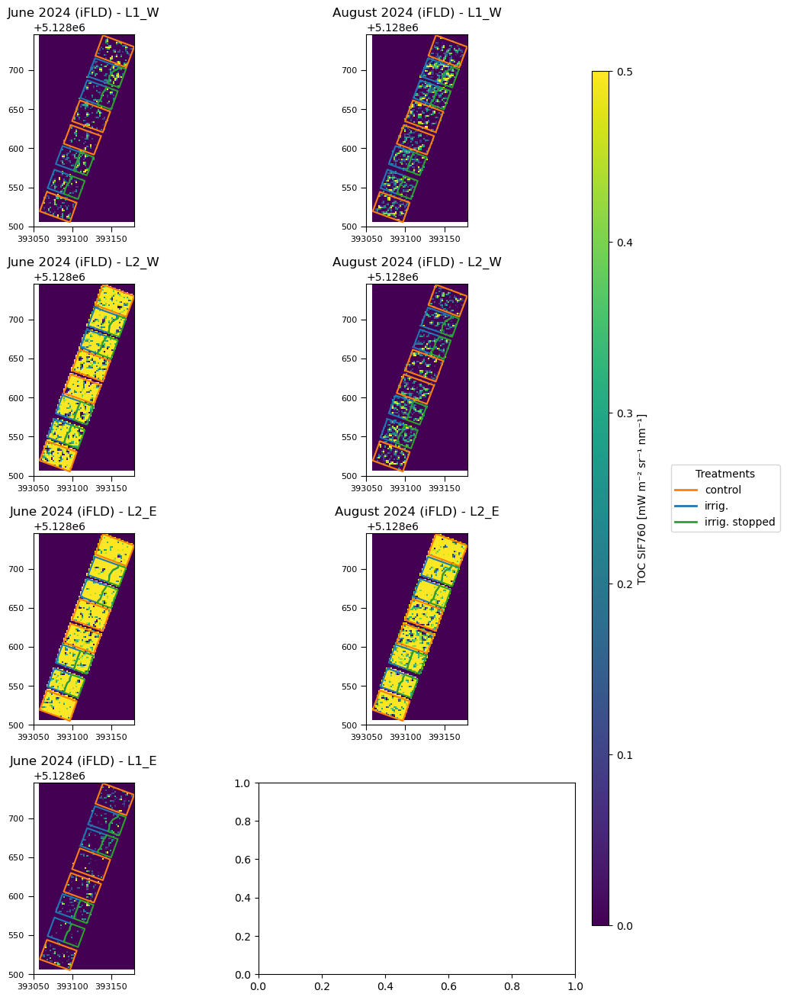

In [40]:
# Crop rasters to treatments
rasters_june_clipped = clip_rasters_to_treatment(rasters_june_sif_o2a, treatment_areas)
rasters_aug_clipped = clip_rasters_to_treatment(rasters_aug_sif_o2a, treatment_areas)

# plot
plot_sif_overview(rasters_june_clipped, rasters_aug_clipped,
                  treatments, treatment_areas, treatment_color_map,
                  vmin=0, vmax=0.5, legend_labels=treatment_labels,
                  tick_interval=50, legend_unit="TOC SIF760 [mW m⁻² sr⁻¹ nm⁻¹]")

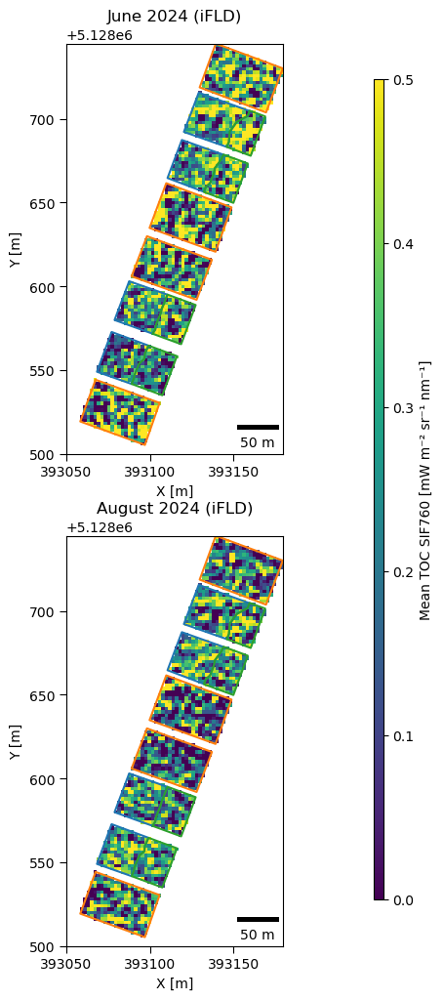

In [41]:
# Stack rasters for June and August along a new dimension 'flight'
june_stack = xr.concat(rasters_june_sif_o2a, dim='flight')
aug_stack  = xr.concat(rasters_aug_sif_o2a, dim='flight')

# Compute mean across flights
june_mean = june_stack.mean(dim='flight')
aug_mean  = aug_stack.mean(dim='flight')

june_mean_clipped = june_mean.rio.clip(treatment_areas.geometry, treatment_areas.crs, drop=True)
aug_mean_clipped  = aug_mean.rio.clip(treatment_areas.geometry, treatment_areas.crs, drop=True)

fig, axes = plt.subplots(2, 1, figsize=(5, 12))
rasters = [june_mean_clipped, aug_mean_clipped]
months = ["June 2024 (iFLD)", "August 2024 (iFLD)"]

# Set tick interval in meters
tick_interval = 50
xticks = np.arange(np.floor(minx / tick_interval) * tick_interval,
                   np.ceil(maxx / tick_interval) * tick_interval,
                   tick_interval)
yticks = np.arange(np.floor(miny / tick_interval) * tick_interval,
                   np.ceil(maxy / tick_interval) * tick_interval,
                   tick_interval)

for ax, raster, month in zip(axes, rasters, months):
    # Display raster
    im = ax.imshow(raster.values, cmap='viridis', vmin=0, vmax=0.5,
                   extent=[minx, maxx, miny, maxy], origin='upper', interpolation='none')

    # Overlay treatment areas
    for t in treatments:
        polygons = treatment_areas[treatment_areas["treatment"] == t].to_crs(raster.rio.crs)
        patches = []
        for geom in polygons.geometry:
            if geom.geom_type == "Polygon":
                coords = list(geom.exterior.coords)
                patches.append(Polygon(coords, closed=True, fill=False,
                                       edgecolor=treatment_color_map[t], linewidth=1.5))
            elif geom.geom_type == "MultiPolygon":
                for poly in geom:
                    coords = list(poly.exterior.coords)
                    patches.append(Polygon(coords, closed=True, fill=False,
                                           edgecolor=treatment_color_map[t], linewidth=1.5))
        ax.add_collection(PatchCollection(patches, match_original=True))

    # Set bounding box limits
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)

    # Set small tick marks instead of grid
    ax.set_xticks(xticks)
    ax.set_yticks(yticks)
    ax.tick_params(axis='both', which='both', length=5, labelsize=10)  # short ticks

    # Axis labels and title
    ax.set_xlabel("X [m]")
    ax.set_ylabel("Y [m]")
    ax.set_title(month)

    # Scale bar
    dx = np.abs(raster['x'].values[1] - raster['x'].values[0])
    scalebar = ScaleBar(dx, units="m", location='lower right', color='black', box_alpha=0.5)
    ax.add_artist(scalebar)

# Colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
plt.colorbar(im, cax=cbar_ax, label="Mean TOC SIF760 [mW m⁻² sr⁻¹ nm⁻¹]")

#plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

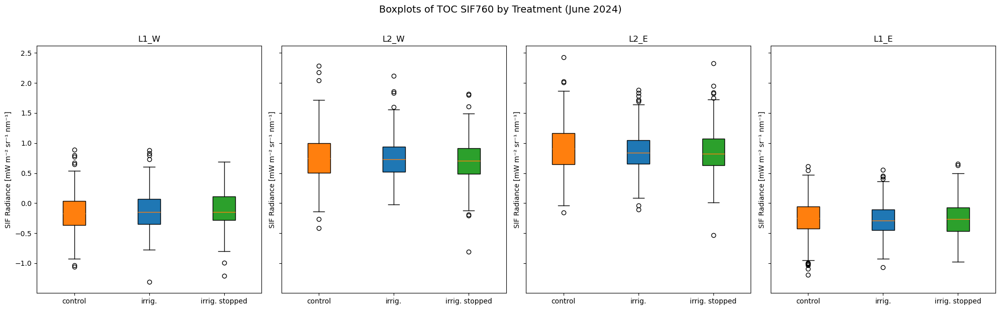

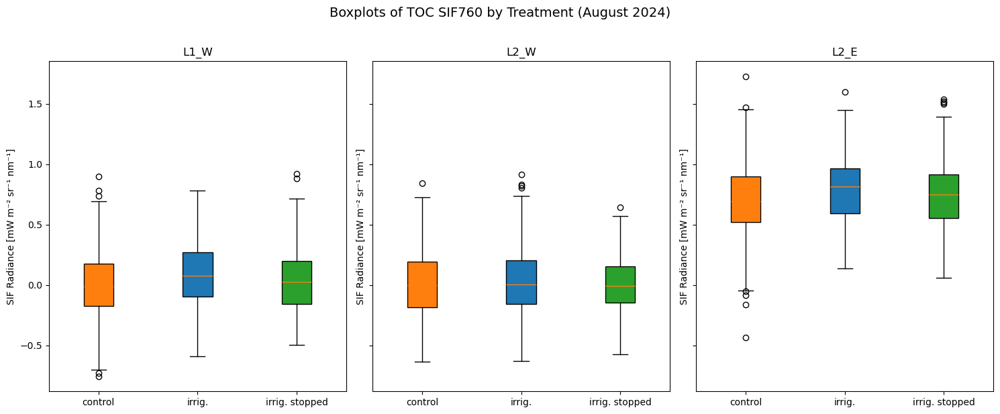

In [42]:
plot_raster_boxplots(
    rasters=rasters_june_sif_o2a,
    raster_labels=["L1_W", "L2_W", "L2_E", "L1_E"],
    crowns=crowns,
    treatment_col="treatment",
    treatments=treatments,
    treatment_labels=treatment_labels,
    treatment_color_map=treatment_color_map,
    title="Boxplots of TOC SIF760 by Treatment (June 2024)",
    ylabel="SIF Radiance [mW m⁻² sr⁻¹ nm⁻¹]"
)

plot_raster_boxplots(
    rasters=rasters_aug_sif_o2a,
    raster_labels=["L1_W", "L2_W", "L2_E", "L1_E"],
    crowns=crowns,
    treatment_col="treatment",
    treatments=treatments,
    treatment_labels=treatment_labels,
    treatment_color_map=treatment_color_map,
    title="Boxplots of TOC SIF760 by Treatment (August 2024)",
    ylabel="SIF Radiance [mW m⁻² sr⁻¹ nm⁻¹]"
)

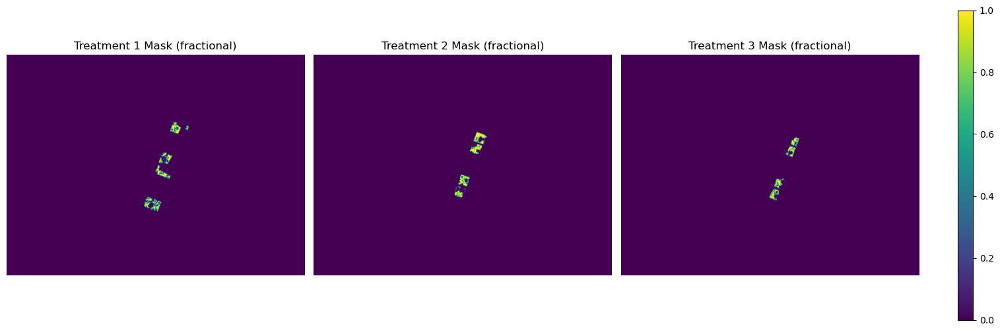

In [43]:
# test weight function
plt.figure(figsize=(15, 5))
for i, t in enumerate([1, 2, 3]):
    _, _, mask = get_pixels_by_treatment_weighted(rasters_june_sif_o2a, crowns, t)
    plt.subplot(1, 3, i+1)
    im = plt.imshow(mask, cmap='viridis', vmin=0, vmax=1)
    plt.title(f'Treatment {t} Mask (fractional)')
    plt.axis('off')
plt.tight_layout()
plt.colorbar(im, ax=plt.gcf().axes, fraction=0.02, pad=0.04)
plt.show()

# Downscaling of SIF760

Load hyperspectral data

In [44]:
# June 2024
raster_files_june_dual = {
    "L1_W": "./Data/Hyplant/coregistration/TOC_REFL/20240613-PHY-1143-1340-L1-W-DUAL_radiance_img_atm_pol-rect_coreg_resampled.tif",
    "L2_W": "./Data/Hyplant/coregistration/TOC_REFL/20240613-PHY-1149-1340-L2-W-DUAL_radiance_img_atm_pol-rect_coreg_resampled.tif",
    "L2_E": "./Data/Hyplant/coregistration/TOC_REFL/20240613-PHY-1154-1340-L2-E-DUAL_radiance_img_atm_pol-rect_coreg_resampled.tif",
    "L1_E": "./Data/Hyplant/coregistration/TOC_REFL/20240613-PHY-1200-1340-L1-E-DUAL_radiance_img_atm_pol-rect_coreg_resampled.tif",
}

# August 2024
raster_files_aug_dual = {
    "L1_W": "./Data/Hyplant/coregistration/TOC_REFL/20240823-PHY-1305-1340-L1-W-DUAL_radiance_img_atm_pol-rect_coreg_resampled.tif",
    "L2_W": "./Data/Hyplant/coregistration/TOC_REFL/20240823-PHY-1259-1340-L2-W-DUAL_radiance_img_atm_pol-rect_coreg_resampled.tif",
    "L2_E": "./Data/Hyplant/coregistration/TOC_REFL/20240823-PHY-1253-1340-L2-E-DUAL_radiance_img_atm_pol-rect_coreg_resampled.tif",
    "L1_E": "./Data/Hyplant/coregistration/TOC_REFL/20240823-PHY-1248-1340-L1-E-DUAL_radiance_img_atm_pol-rect_coreg_resampled.tif"
}

Define relevant bands

In [45]:
# Configuration
REFL_SCALE = 10000.0
FILL_VALUE = 15000  # HyPlant fill value

RED_RANGE = (665, 680)
NIR_RANGE = (795, 810)
VIS_RANGE = (400, 700)

# FCVI
NIR_FCVI_RANGE = (768, 773) # +/- 2 nm around 770

# MTCI
MTCI_NIR_RANGE = (746.5,761.5)
MTCI_REDEDGE_RANGE = (699,719)
MTCI_RED_RANGE = (673.5,688.5)

# saR2F
NIR_saR2F_RANGE = NIR_FCVI_RANGE 
RED_saR2F_RANGE = (436,440) # +/- 2 nm around 438
BLUE_saR2F_RANGE = (673,677) # +/- 2 nm around 675

ndvi_threshold = 0.5
fcvi_threshold = 0.18

Calculate all relevant indices, fesc and fAPARchl

In [46]:
# load metadata from header file of one of the rasters
hdr_path = "E:/Pfynwald/Data/HyPlant/original/TOC_REFL/20240823-PHY-1305-1340-L1-W-DUAL_radiance_img_atm_pol-rect.hdr"
wavelengths = load_wavelengths(hdr_path)

# Calculate indices for June and August
june_results = process_month_indices(raster_files_june_dual, wavelengths, ndvi_threshold=ndvi_threshold,fcvi_threshold=fcvi_threshold)
aug_results  = process_month_indices(raster_files_aug_dual, wavelengths, ndvi_threshold=ndvi_threshold,fcvi_threshold=fcvi_threshold)


## Normalize SIF by fesc (and APAR) to calculate SIFleaf (and FQE) 

In [47]:
# --- Align rasters ---
# June
fcvi_june_aligned = june_results["FCVI"].rio.reproject_match(ref_june_sif_o2a)
fesc_fcvi_june_aligned = june_results["fesc_SIF760_FCVI"].rio.write_crs("EPSG:32632")

nirv_june_aligned = june_results["NIRv"].rio.reproject_match(ref_june_sif_o2a)
fesc_nirv_june_aligned = june_results["fesc_SIF760_NIRv"].rio.write_crs("EPSG:32632")

saR2F_june_aligned = june_results["saR2F"].rio.reproject_match(ref_june_sif_o2a)
fesc_saR2F_june_aligned = june_results["fesc_SIF760_saR2F"].rio.write_crs("EPSG:32632")

faparchl_june_aligned = june_results["fAPARchl"].rio.reproject_match(ref_june_sif_o2a)

# Aug
fcvi_aug_aligned = aug_results["FCVI"].rio.reproject_match(ref_aug_sif_o2a)
fesc_fcvi_aug_aligned = aug_results["fesc_SIF760_FCVI"].rio.write_crs("EPSG:32632")

nirv_aug_aligned = aug_results["NIRv"].rio.reproject_match(ref_aug_sif_o2a)
fesc_nirv_aug_aligned = aug_results["fesc_SIF760_NIRv"].rio.write_crs("EPSG:32632")

saR2F_aug_aligned = aug_results["saR2F"].rio.reproject_match(ref_aug_sif_o2a)
fesc_saR2F_aug_aligned = aug_results["fesc_SIF760_saR2F"].rio.write_crs("EPSG:32632")

faparchl_aug_aligned = aug_results["fAPARchl"].rio.reproject_match(ref_aug_sif_o2a)

In [48]:
# --- Masks for FCVI ---
mask_june_fcvi = (fcvi_june_aligned > fcvi_threshold) & (faparchl_june_aligned > 0)
mask_aug_fcvi  = (fcvi_aug_aligned > fcvi_threshold) & (faparchl_aug_aligned > 0)

# --- PAR values ---
PAR_june = 0.219 * 2140.0 * 1000  # [mW/m²]
PAR_aug  = 0.219 * 1642.5 * 1000

# --- SIFleaf calculations ---
# Using NIRv (Zeng et al. 2019)
sifleaf760_nirv_june = [(np.pi*sif) / (fesc_nirv_june_aligned) for sif in rasters_june_sif_o2a]
sifleaf760_nirv_june_mean = xr.concat(sifleaf760_nirv_june, dim="scene").mean(dim="scene")

sifleaf760_nirv_aug = [(np.pi*sif) / (fesc_nirv_aug_aligned) for sif in rasters_aug_sif_o2a]
sifleaf760_nirv_aug_mean = xr.concat(sifleaf760_nirv_aug, dim="scene").mean(dim="scene")

# Using FCVI (Yang et al. 2020, Siegmann et al. 2021)
sifleaf760_fcvi_june = [(np.pi*sif) / (fesc_fcvi_june_aligned) for sif in rasters_june_sif_o2a]
#sifleaf760_fcvi_june = [r.where(mask_june_fcvi) for r in sifleaf760_fcvi_june]  # optional masking
sifleaf760_fcvi_june_mean = xr.concat(sifleaf760_fcvi_june, dim="scene").mean(dim="scene")

sifleaf760_fcvi_aug = [(np.pi*sif) / (fesc_fcvi_aug_aligned) for sif in rasters_aug_sif_o2a]
#sifleaf760_fcvi_aug = [r.where(mask_aug_fcvi) for r in sifleaf760_fcvi_aug]  # optional masking
sifleaf760_fcvi_aug_mean = xr.concat(sifleaf760_fcvi_aug, dim="scene").mean(dim="scene")

# Using saR2F (Yang et al. 2025)
sifleaf760_saR2F_june = [(np.pi*sif) / (fesc_saR2F_june_aligned) for sif in rasters_june_sif_o2a]
sifleaf760_saR2F_june_mean = xr.concat(sifleaf760_saR2F_june, dim="scene").mean(dim="scene")

sifleaf760_saR2F_aug = [(np.pi*sif) / (fesc_saR2F_aug_aligned) for sif in rasters_aug_sif_o2a]
sifleaf760_saR2F_aug_mean = xr.concat(sifleaf760_saR2F_aug, dim="scene").mean(dim="scene")

# --- FQE calculations ---
# Using NIRv
FQE760_nirv_june = [(np.pi*sif) / (nirv_june_aligned * PAR_june) for sif in rasters_june_sif_o2a]
FQE760_nirv_june_mean = xr.concat(FQE760_nirv_june, dim="scene").mean(dim="scene")

FQE760_nirv_aug = [(np.pi*sif) / (nirv_aug_aligned * PAR_aug) for sif in rasters_aug_sif_o2a]
FQE760_nirv_aug_mean = xr.concat(FQE760_nirv_aug, dim="scene").mean(dim="scene")

# Using FCVI
FQE760_fcvi_june = [(np.pi*sif) / (fcvi_june_aligned * PAR_june) for sif in rasters_june_sif_o2a]
#FQE760_fcvi_june = [r.where(mask_june_fcvi) for r in FQE760_fcvi_june]  # optional masking
FQE760_fcvi_june_mean = xr.concat(FQE760_fcvi_june, dim="scene").mean(dim="scene")

FQE760_fcvi_aug = [(np.pi*sif) / (fcvi_aug_aligned * PAR_aug) for sif in rasters_aug_sif_o2a]
#FQE760_fcvi_aug = [r.where(mask_aug_fcvi) for r in FQE760_fcvi_aug]  # optional masking
FQE760_fcvi_aug_mean = xr.concat(FQE760_fcvi_aug, dim="scene").mean(dim="scene")

# Using saR2F
FQE760_saR2F_june = [(np.pi*sif) / (saR2F_june_aligned * PAR_june) for sif in rasters_june_sif_o2a]
FQE760_saR2F_june_mean = xr.concat(FQE760_saR2F_june, dim="scene").mean(dim="scene")

FQE760_saR2F_aug = [(np.pi*sif) / (saR2F_aug_aligned * PAR_aug) for sif in rasters_aug_sif_o2a]
FQE760_saR2F_aug_mean = xr.concat(FQE760_saR2F_aug, dim="scene").mean(dim="scene")

Export as .tif

In [ ]:
'''# Export to GeoTIFF
# --- Create output directories ---
os.makedirs("./Data/Results/FQE/June/", exist_ok=True)
os.makedirs("./Data/Results/FQE/August/", exist_ok=True)

# ==========================
# === iFLD - JUNE 2024 ===
# ==========================
print("Saving iFLD FQE rasters for June...")

FQE760_nirv_june_mean.rio.to_raster("./Data/Results/FQE/June/FQE760_NIRV_iFLD_June.tif")
print(" → FQE760_NIRV_iFLD_June.tif")

FQE760_fcvi_june_mean.rio.to_raster("./Data/Results/FQE/June/FQE760_FCVI_iFLD_June.tif")
print(" → FQE760_FCVI_iFLD_June.tif")

FQE760_saR2F_june_mean.rio.to_raster("./Data/Results/FQE/June/FQE760_SAR2F_iFLD_June.tif")
print(" → FQE760_SAR2F_iFLD_June.tif")

print("Done.\n")

# ============================
# === iFLD - AUGUST 2024 ===
# ============================
print("Saving iFLD FQE rasters for August...")

FQE760_nirv_aug_mean.rio.to_raster("./Data/Results/FQE/August/FQE760_NIRV_iFLD_August.tif")
print(" → FQE760_NIRV_iFLD_August.tif")

FQE760_fcvi_aug_mean.rio.to_raster("./Data/Results/FQE/August/FQE760_FCVI_iFLD_August.tif")
print(" → FQE760_FCVI_iFLD_August.tif")

FQE760_saR2F_aug_mean.rio.to_raster("./Data/Results/FQE/August/FQE760_SAR2F_iFLD_August.tif")
print(" → FQE760_SAR2F_iFLD_August.tif")

print("Done.\n")'''

Saving iFLD FQE rasters for June...
 → FQE760_NIRV_iFLD_June.tif
 → FQE760_FCVI_iFLD_June.tif
 → FQE760_SAR2F_iFLD_June.tif
Done.

Saving iFLD FQE rasters for August...
 → FQE760_NIRV_iFLD_August.tif
 → FQE760_FCVI_iFLD_August.tif
 → FQE760_SAR2F_iFLD_August.tif
Done.



### Plots of SIF TOC


=== SIF TOC map ===


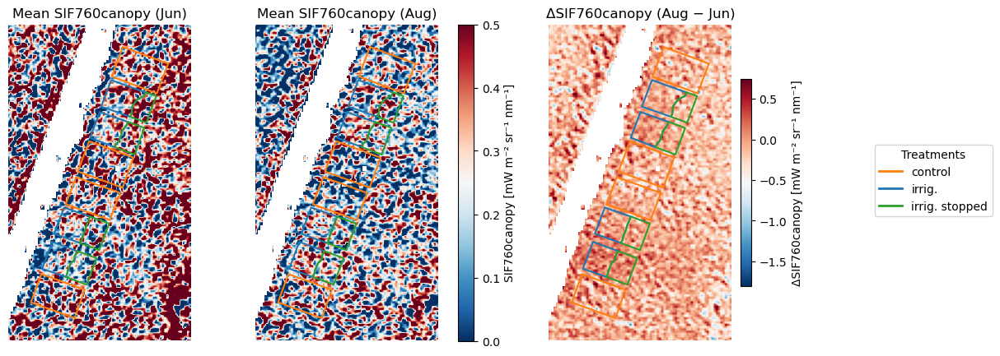

In [50]:
sifcanopy760_june_mean = xr.concat(rasters_june_sif_o2a, dim="scene").mean(dim="scene")
sifcanopy760_aug_mean = xr.concat(rasters_aug_sif_o2a, dim="scene").mean(dim="scene")

# NDVI mask
ndvi_june_aligned = june_results["NDVI"].rio.reproject_match(ref_june_sif_o2a)
ndvi_aug_aligned  = aug_results["NDVI"].rio.reproject_match(ref_june_sif_o2a)
ndvi_mask = xr.where((ndvi_june_aligned >= ndvi_threshold) & (ndvi_aug_aligned >= ndvi_threshold), True, False)

print(f"\n=== SIF TOC map ===")
plot_monthly_comparison(
    sifcanopy760_june_mean,
    sifcanopy760_aug_mean,
    treatments,
    treatment_areas,
    treatment_color_map,
    transform,
    xmin_pix, xmax_pix, ymin_pix, ymax_pix,
    titles=("Mean SIF760canopy (Jun)", "Mean SIF760canopy (Aug)", "ΔSIF760canopy (Aug − Jun)"),
    value_label="SIF760canopy [mW m⁻² sr⁻¹ nm⁻¹]",
    diff_label="ΔSIF760canopy [mW m⁻² sr⁻¹ nm⁻¹]",
    legend_labels=["control", "irrig.", "irrig. stopped"],
    vmin=0,
    vmax=0.5,
    mask=ndvi_mask
)


=== SIF TOC statistics ===

Mean SIF760canopy (June 2024):
  control: weighted mean = 3.261e-01
  irrig.: weighted mean = 3.076e-01
  irrig. stopped: weighted mean = 3.108e-01

Mean SIF760canopy (August 2024):
  control: weighted mean = 2.444e-01
  irrig.: weighted mean = 3.015e-01
  irrig. stopped: weighted mean = 2.698e-01


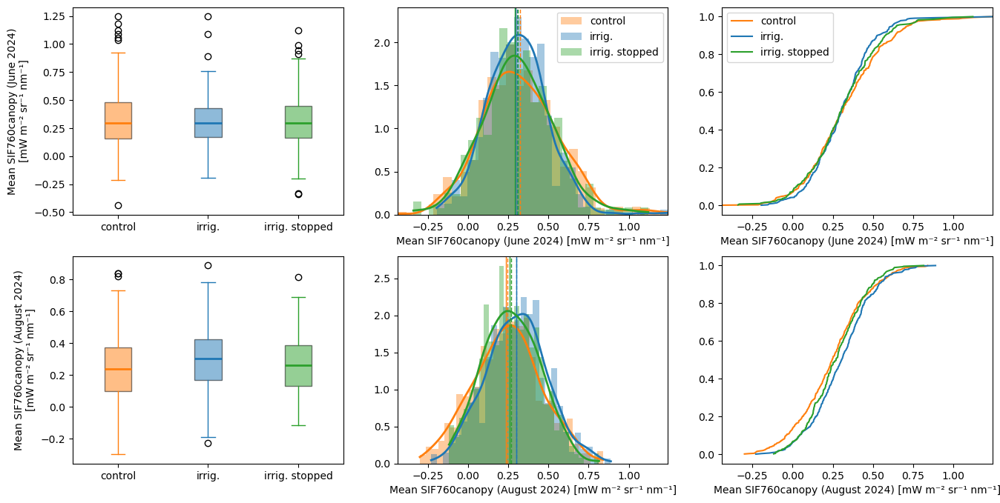

In [51]:
# SIF760canopy statistics
datasets_norm = [
    (sifcanopy760_june_mean, "Mean SIF760canopy (June 2024)"),
    (sifcanopy760_aug_mean,  "Mean SIF760canopy (August 2024)"),
]

print(f"\n=== SIF TOC statistics ===")
plot_weighted_sif_stats_full(datasets_norm, crowns, treatments, colors, treatment_labels, unit_label="mW m⁻² sr⁻¹ nm⁻¹")

### Plots of fAPAR

Plot indices to estimate APAR in comparion. It can be seen that the NDVI saturates while the WDRVI shows distinct features, even within the small treatment areas.


=== NDVI map ===


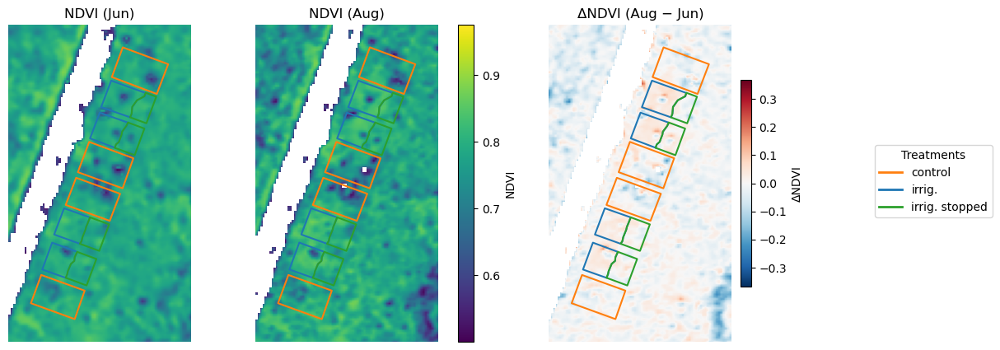


=== WDRVI map ===


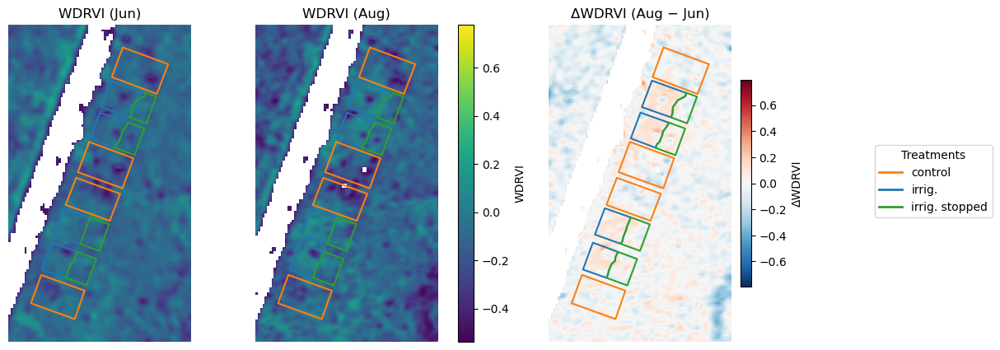

In [52]:
metrics = ["NDVI", "WDRVI"]

for metric in metrics:
    june = june_results[metric]
    aug  = aug_results[metric]

    print(f"\n=== {metric} map ===")
    plot_monthly_comparison(
        june,
        aug,
        treatments,
        treatment_areas,
        treatment_color_map,
        transform,
        xmin_pix, xmax_pix, ymin_pix, ymax_pix,
        titles=(f"{metric} (Jun)", f"{metric} (Aug)", f"Δ{metric} (Aug − Jun)"),
        cmaps=("viridis", "viridis", "RdBu_r"),
        value_label=metric,
        diff_label=f"Δ{metric}",
        symmetric_diff=True,
        legend_labels=["control", "irrig.", "irrig. stopped"],
    )


=== NDVI statistics ===

Mean NDVI (June 2024):
  control: weighted mean = 7.805e-01
  irrig.: weighted mean = 7.910e-01
  irrig. stopped: weighted mean = 7.861e-01

Mean NDVI (August 2024):
  control: weighted mean = 7.784e-01
  irrig.: weighted mean = 8.235e-01
  irrig. stopped: weighted mean = 7.944e-01


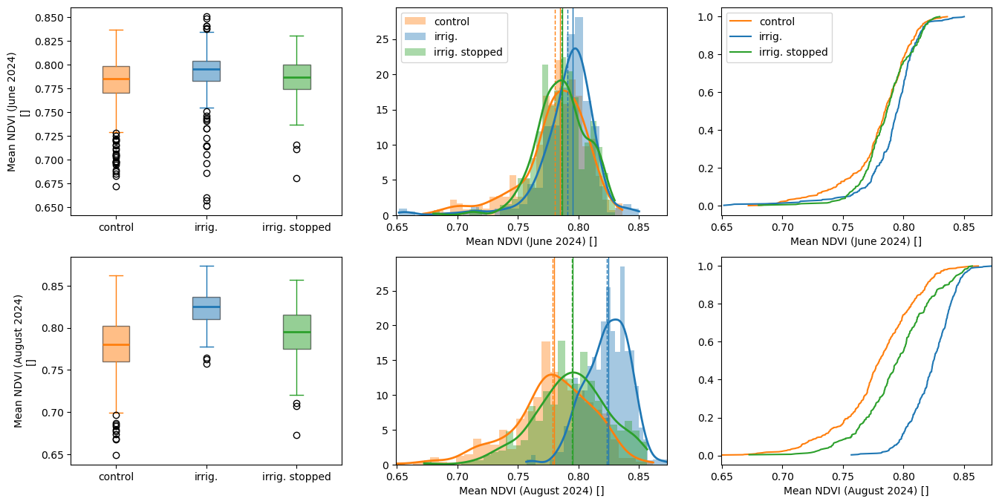


=== WDRVI statistics ===

Mean WDRVI (June 2024):
  control: weighted mean = -9.880e-02
  irrig.: weighted mean = -7.242e-02
  irrig. stopped: weighted mean = -8.584e-02

Mean WDRVI (August 2024):
  control: weighted mean = -1.025e-01
  irrig.: weighted mean = 1.938e-02
  irrig. stopped: weighted mean = -6.117e-02


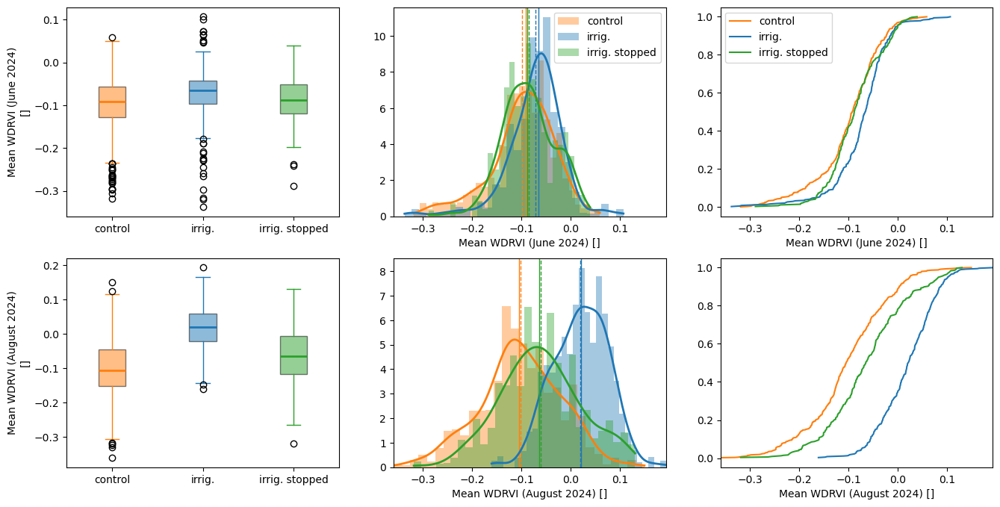

In [53]:
# Define metrics and their corresponding June/Aug rasters
metrics = [
    ("NDVI",  june_results["NDVI"],  aug_results["NDVI"]),
    ("WDRVI", june_results["WDRVI"], aug_results["WDRVI"]),
]

# Loop through metrics and plot weighted SIF statistics
for metric, june, aug in metrics:
    datasets_norm = [
        (june, f"Mean {metric} (June 2024)"),
        (aug,  f"Mean {metric} (August 2024)"),
    ]
    print(f"\n=== {metric} statistics ===")
    plot_weighted_sif_stats_full(
        datasets_norm,
        crowns,
        treatments,
        colors,
        treatment_labels
    )


=== fAPARchl map ===


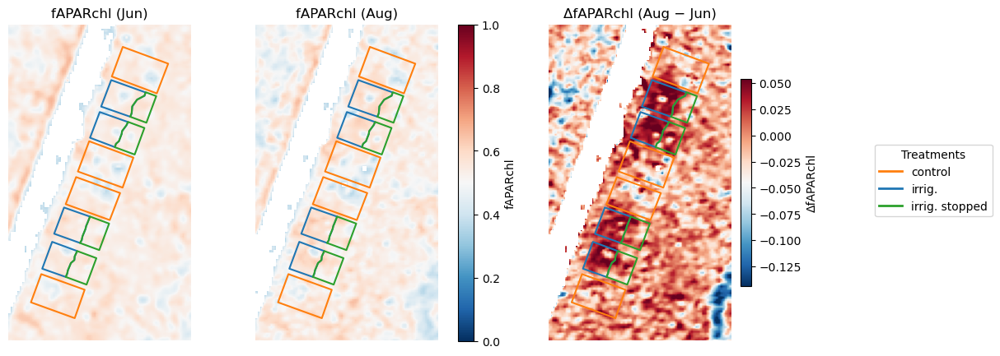

In [54]:
## Plot fAPARchl
print(f"\n=== fAPARchl map ===")
plot_monthly_comparison(
    faparchl_june_aligned,
    faparchl_aug_aligned,
    treatments,
    treatment_areas,
    treatment_color_map,
    transform,
    xmin_pix, xmax_pix, ymin_pix, ymax_pix,
    vmin=0,
    vmax=1,
    titles=("fAPARchl (Jun)", "fAPARchl (Aug)", "ΔfAPARchl (Aug − Jun)"),
    value_label="fAPARchl",
    diff_label="ΔfAPARchl",
    legend_labels=["control", "irrig.", "irrig. stopped"],
)


=== fAPARchl statistics ===

Mean fAPARchl (June 2024):
  control: weighted mean = 5.333e-01
  irrig.: weighted mean = 5.440e-01
  irrig. stopped: weighted mean = 5.385e-01

Mean fAPARchl (August 2024):
  control: weighted mean = 5.318e-01
  irrig.: weighted mean = 5.814e-01
  irrig. stopped: weighted mean = 5.486e-01


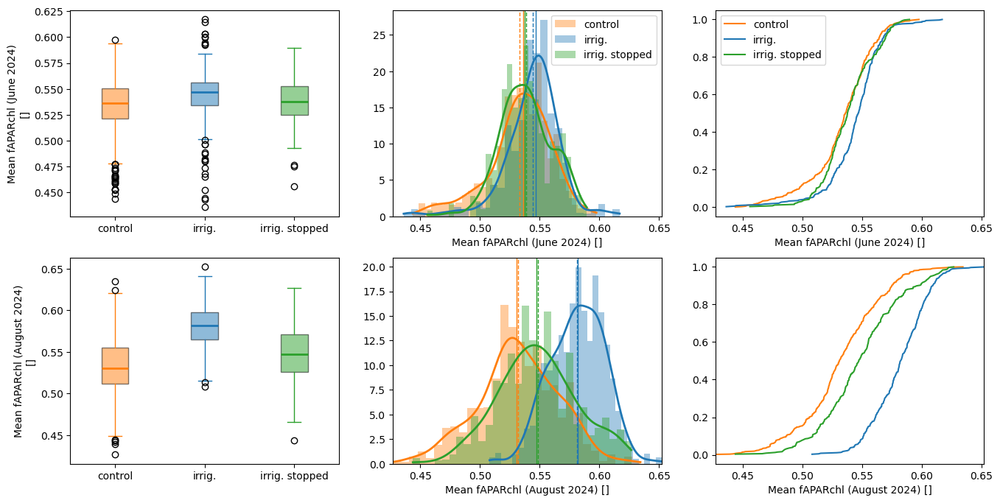

In [55]:
datasets_norm = [
    (faparchl_june_aligned, "Mean fAPARchl (June 2024)"),
    (faparchl_aug_aligned,  "Mean fAPARchl (August 2024)"),
]

print(f"\n=== fAPARchl statistics ===")
plot_weighted_sif_stats_full(datasets_norm, crowns, treatments, colors, treatment_labels)

### Plots of R2F Indices


=== NIRv map ===


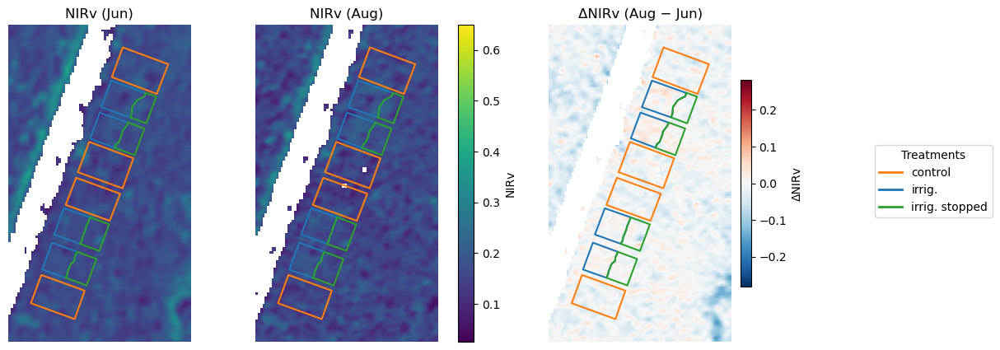


=== FCVI map ===


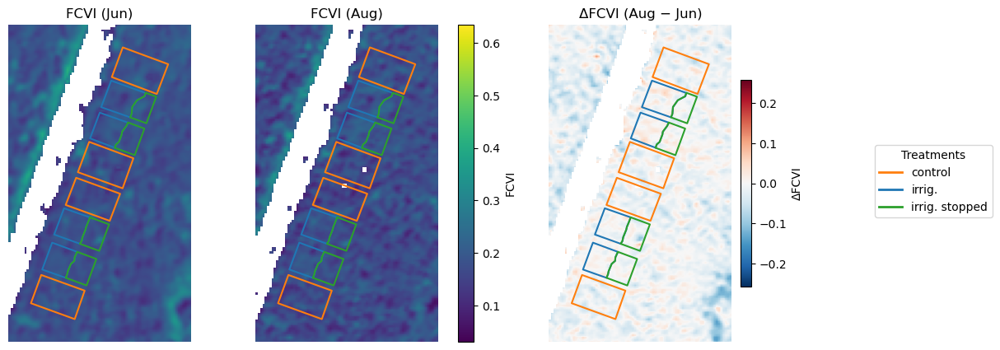


=== saR2F map ===


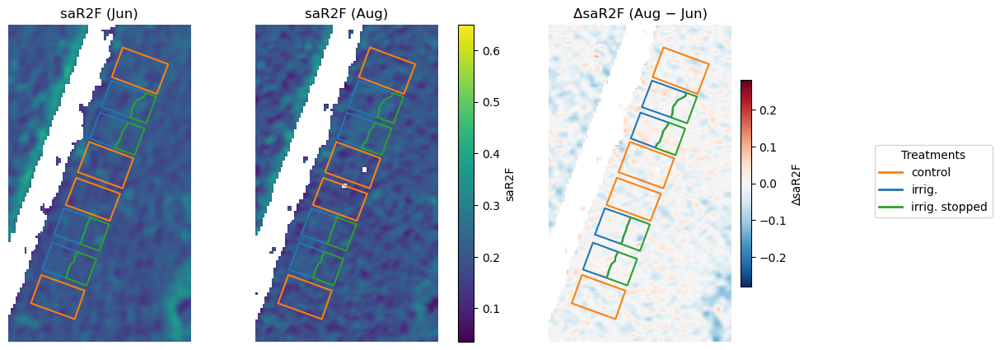

In [56]:
# --- Define metrics to align and plot ---
metrics = [
    ("NIRv",  nirv_june_aligned, nirv_aug_aligned),
    ("FCVI",  fcvi_june_aligned, fcvi_aug_aligned),
    ("saR2F", saR2F_june_aligned, saR2F_aug_aligned),
]

# --- Optionally apply masking (example for FCVI) ---
# fcvi_threshold = 0.2  # for example
# mask_june_fcvi = (aligned["FCVI_june"] > fcvi_threshold) & (faparchl_june_aligned > 0)
# mask_aug_fcvi  = (aligned["FCVI_aug"]  > fcvi_threshold) & (faparchl_aug_aligned > 0)
# aligned["FCVI_june"] = aligned["FCVI_june"].where(mask_june_fcvi)
# aligned["FCVI_aug"]  = aligned["FCVI_aug"].where(mask_aug_fcvi)

# --- Plot comparisons for each metric ---
for metric, june_raster, aug_raster in metrics:
    print(f"\n=== {metric} map ===")
    plot_monthly_comparison(
        june_raster,
        aug_raster,
        treatments,
        treatment_areas,
        treatment_color_map,
        transform,
        xmin_pix, xmax_pix, ymin_pix, ymax_pix,
        titles=(f"{metric} (Jun)", f"{metric} (Aug)", f"Δ{metric} (Aug − Jun)"),
        cmaps=("viridis", "viridis", "RdBu_r"),
        value_label=metric,
        diff_label=f"Δ{metric}",
        symmetric_diff=True,
        legend_labels=["control", "irrig.", "irrig. stopped"],
    )


=== NIRv statistics ===

Mean NIRv (June 2024):
  control: weighted mean = 1.720e-01
  irrig.: weighted mean = 1.784e-01
  irrig. stopped: weighted mean = 1.748e-01

Mean NIRv (August 2024):
  control: weighted mean = 1.634e-01
  irrig.: weighted mean = 1.897e-01
  irrig. stopped: weighted mean = 1.727e-01


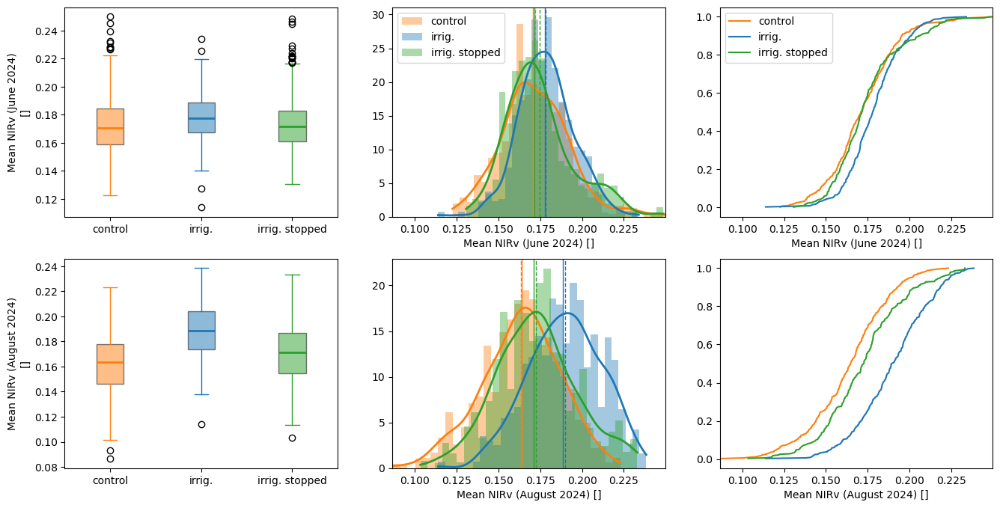


=== FCVI statistics ===

Mean FCVI (June 2024):
  control: weighted mean = 1.838e-01
  irrig.: weighted mean = 1.890e-01
  irrig. stopped: weighted mean = 1.860e-01

Mean FCVI (August 2024):
  control: weighted mean = 1.749e-01
  irrig.: weighted mean = 1.966e-01
  irrig. stopped: weighted mean = 1.828e-01


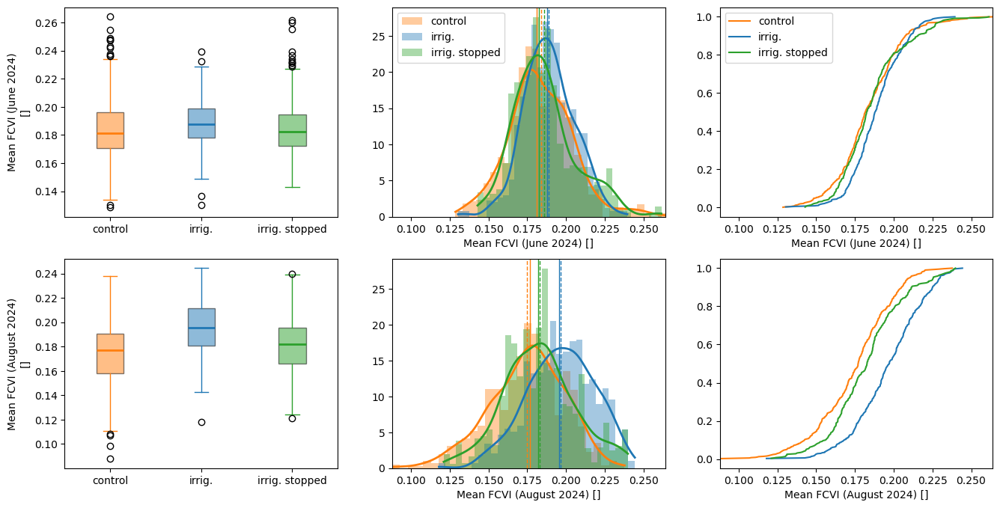


=== saR2F statistics ===

Mean saR2F (June 2024):
  control: weighted mean = 2.018e-01
  irrig.: weighted mean = 2.063e-01
  irrig. stopped: weighted mean = 2.036e-01

Mean saR2F (August 2024):
  control: weighted mean = 1.943e-01
  irrig.: weighted mean = 2.136e-01
  irrig. stopped: weighted mean = 2.013e-01


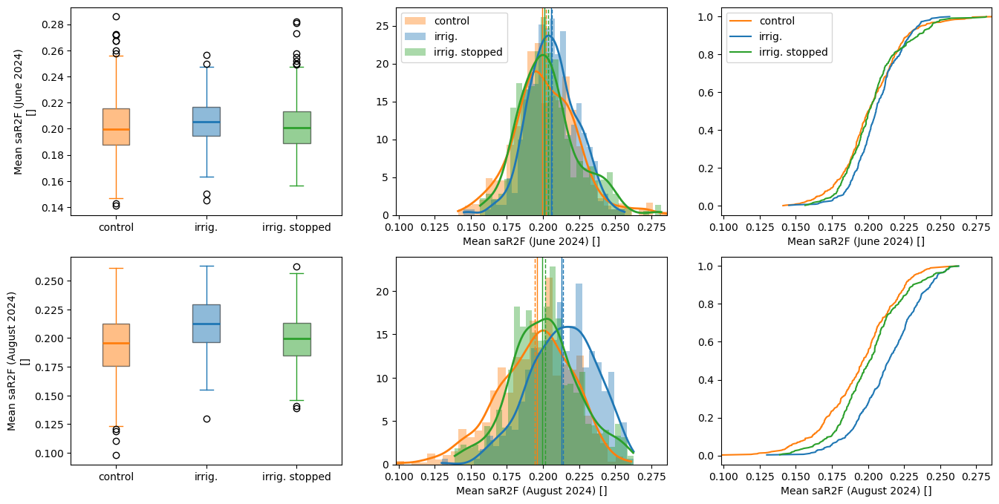

In [57]:
metrics = [
    ("NIRv",  nirv_june_aligned,  nirv_aug_aligned),
    ("FCVI",  fcvi_june_aligned,  fcvi_aug_aligned),
    ("saR2F", saR2F_june_aligned, saR2F_aug_aligned),
]

for metric, june, aug in metrics:
    datasets_norm = [
        (june, f"Mean {metric} (June 2024)"),
        (aug,  f"Mean {metric} (August 2024)"),
    ]
    print(f"\n=== {metric} statistics ===")
    plot_weighted_sif_stats_full(datasets_norm, crowns, treatments, colors, treatment_labels)

### Plots of fesc


=== fesc (NIRv) map ===


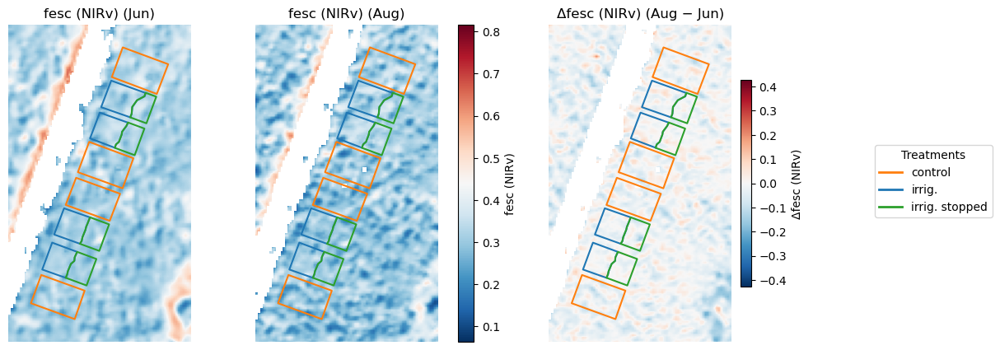


=== fesc (FCVI) map ===


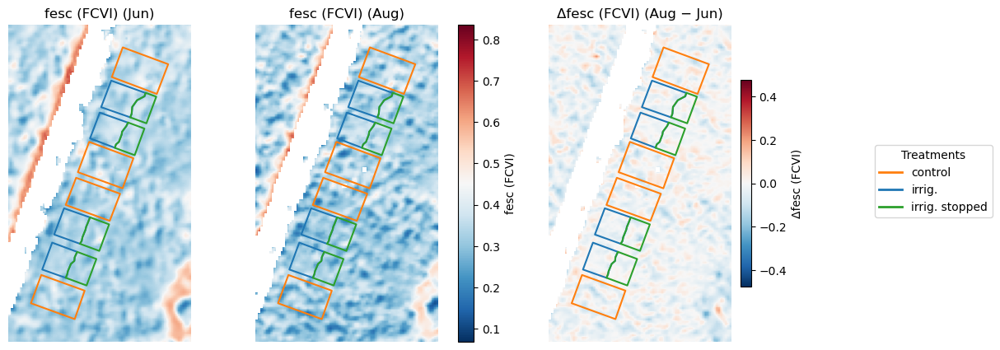


=== fesc (saR2F) map ===


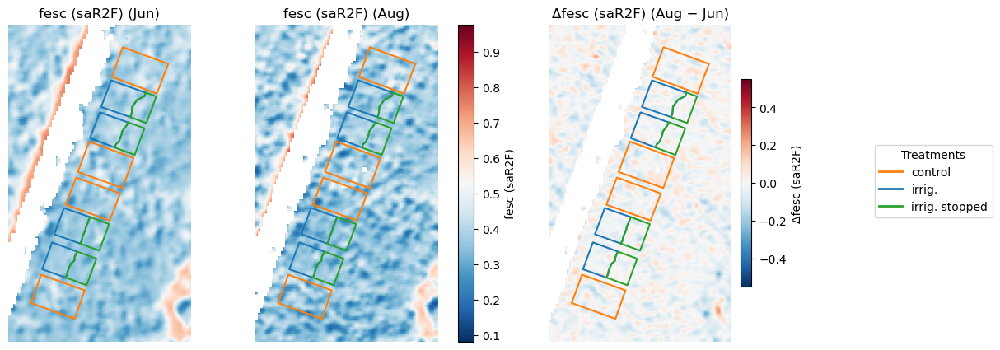

In [58]:
# --- Define metrics to plot ---
metrics = [
    ("fesc (NIRv)",  fesc_nirv_june_aligned, fesc_nirv_aug_aligned),
    ("fesc (FCVI)",  fesc_fcvi_june_aligned, fesc_fcvi_aug_aligned),
    ("fesc (saR2F)", fesc_saR2F_june_aligned, fesc_saR2F_aug_aligned),
]

# --- Optionally apply masking (example for FCVI) ---
# fcvi_threshold = 0.2  # for example
# mask_june_fcvi = (aligned["FCVI_june"] > fcvi_threshold) & (faparchl_june_aligned > 0)
# mask_aug_fcvi  = (aligned["FCVI_aug"]  > fcvi_threshold) & (faparchl_aug_aligned > 0)
# aligned["FCVI_june"] = aligned["FCVI_june"].where(mask_june_fcvi)
# aligned["FCVI_aug"]  = aligned["FCVI_aug"].where(mask_aug_fcvi)

# --- Plot comparisons for each metric ---
for metric, june_raster, aug_raster in metrics:
    print(f"\n=== {metric} map ===")
    plot_monthly_comparison(
        june_raster,
        aug_raster,
        treatments,
        treatment_areas,
        treatment_color_map,
        transform,
        xmin_pix, xmax_pix, ymin_pix, ymax_pix,
        titles=(f"{metric} (Jun)", f"{metric} (Aug)", f"Δ{metric} (Aug − Jun)"),
        cmaps=("RdBu_r", "RdBu_r", "RdBu_r"),
        value_label=metric,
        diff_label=f"Δ{metric}",
        symmetric_diff=True,
        legend_labels=["control", "irrig.", "irrig. stopped"]
    )


Mean fesc (NIRv) (June 2024):
  control: weighted mean = 3.227e-01
  irrig.: weighted mean = 3.278e-01
  irrig. stopped: weighted mean = 3.241e-01

Mean fesc (NIRv) (August 2024):
  control: weighted mean = 3.079e-01
  irrig.: weighted mean = 3.264e-01
  irrig. stopped: weighted mean = 3.143e-01


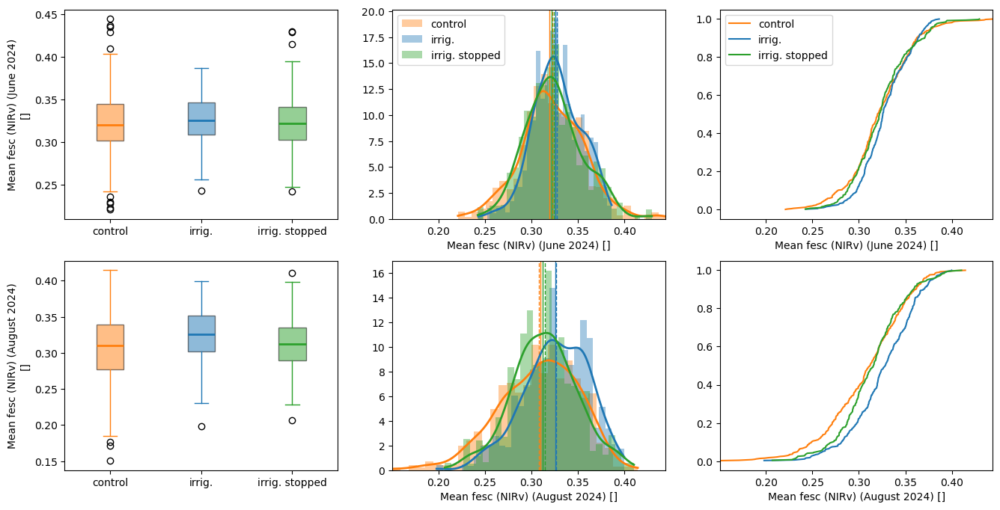


Mean fesc (FCVI) (June 2024):
  control: weighted mean = 3.452e-01
  irrig.: weighted mean = 3.476e-01
  irrig. stopped: weighted mean = 3.453e-01

Mean fesc (FCVI) (August 2024):
  control: weighted mean = 3.301e-01
  irrig.: weighted mean = 3.384e-01
  irrig. stopped: weighted mean = 3.331e-01


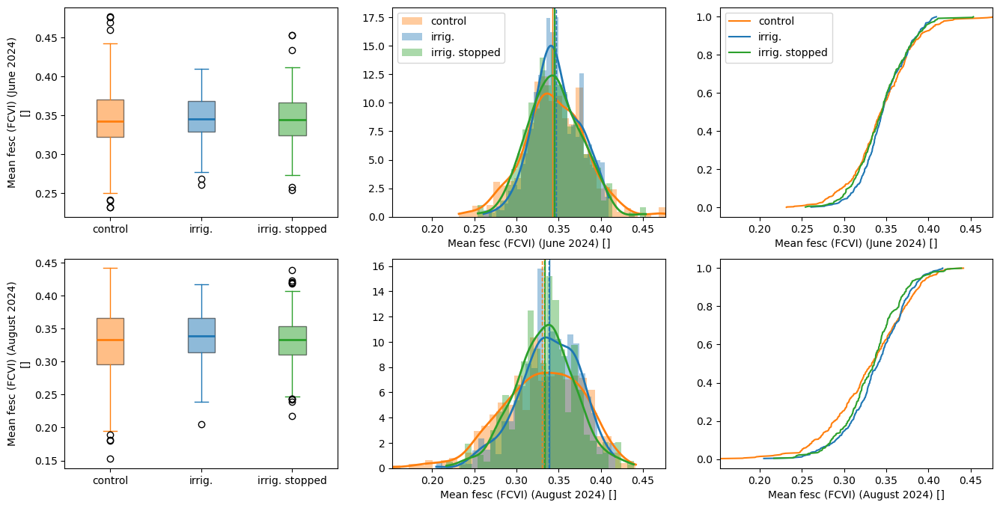


Mean fesc (saR2F) (June 2024):
  control: weighted mean = 3.794e-01
  irrig.: weighted mean = 3.796e-01
  irrig. stopped: weighted mean = 3.781e-01

Mean fesc (saR2F) (August 2024):
  control: weighted mean = 3.671e-01
  irrig.: weighted mean = 3.678e-01
  irrig. stopped: weighted mean = 3.673e-01


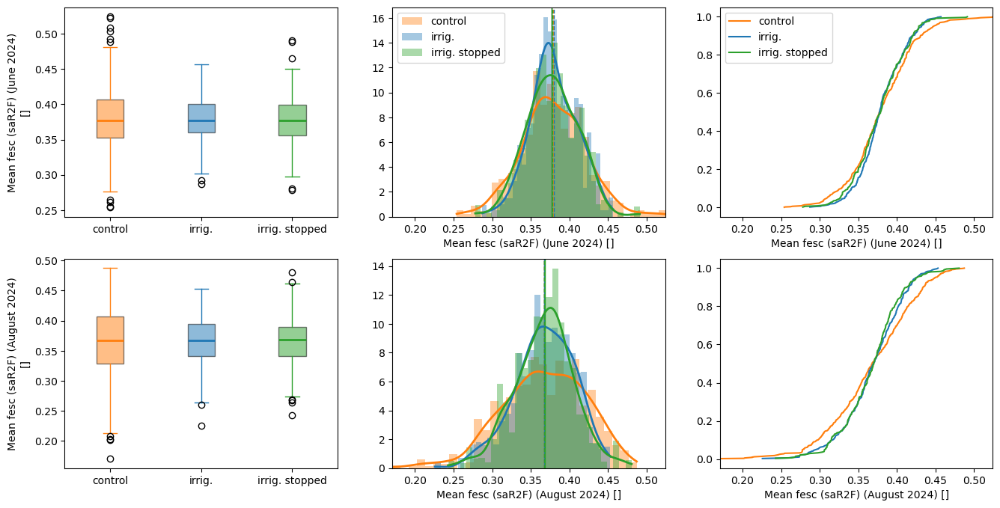

In [59]:
metrics = [
    ("fesc (NIRv)",  fesc_nirv_june_aligned,fesc_nirv_aug_aligned),
    ("fesc (FCVI)",  fesc_fcvi_june_aligned,fesc_fcvi_aug_aligned),
    ("fesc (saR2F)", fesc_saR2F_june_aligned,fesc_saR2F_aug_aligned),
]

for metric, june, aug in metrics:
    datasets_norm = [
        (june, f"Mean {metric} (June 2024)"),
        (aug,  f"Mean {metric} (August 2024)"),
    ]
    plot_weighted_sif_stats_full(datasets_norm, crowns, treatments, colors, treatment_labels)

### Plots of SIFleaf760


=== SIF760leaf (NIRv) map ===


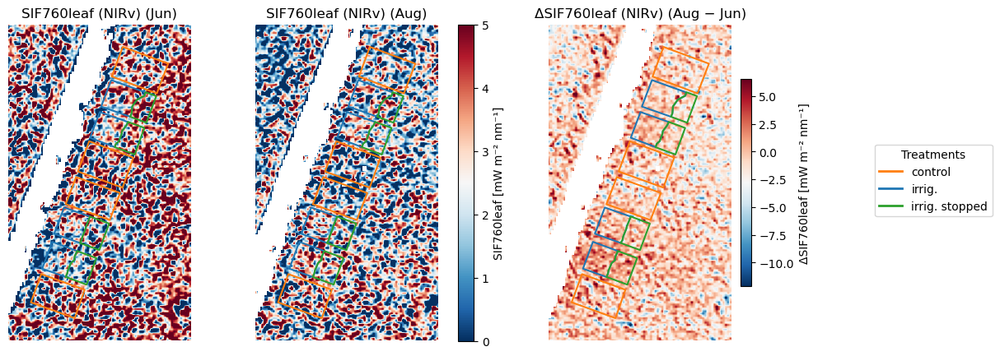


=== SIF760leaf (FCVI) map ===


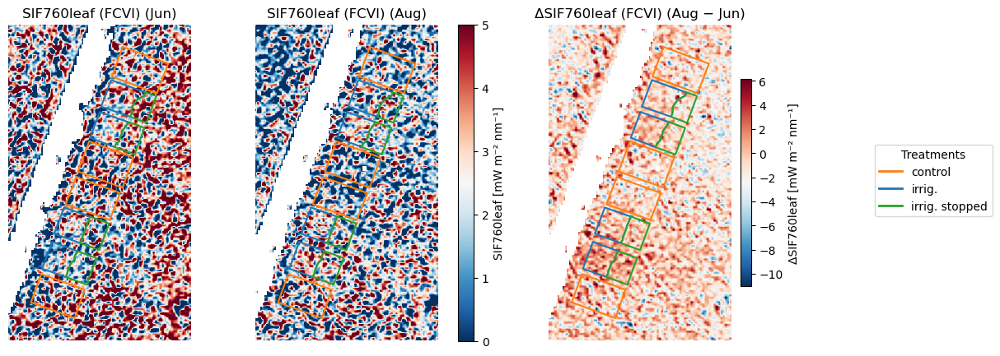


=== SIF760leaf (saR2F) map ===


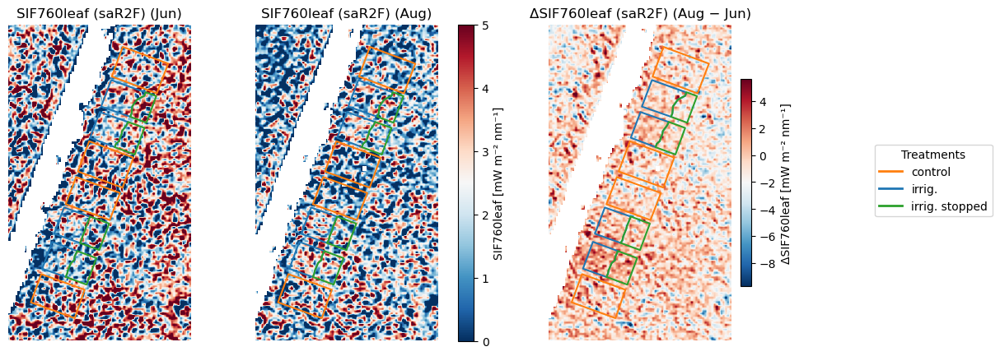

In [60]:
# --- Map metrics to their data and plot parameters ---
metrics_to_plot = {
    "SIF760leaf (NIRv)": {
        "june": sifleaf760_nirv_june_mean,
        "aug": sifleaf760_nirv_aug_mean,
        "vmin": 0,
        "vmax": 5,
        "value_label": "SIF760leaf [mW m⁻² nm⁻¹]"
    },
    "SIF760leaf (FCVI)": {
        "june": sifleaf760_fcvi_june_mean,
        "aug": sifleaf760_fcvi_aug_mean,
        "vmin": 0,
        "vmax": 5,
        "value_label": "SIF760leaf [mW m⁻² nm⁻¹]"
    },
    "SIF760leaf (saR2F)": {
        "june": sifleaf760_saR2F_june_mean,
        "aug": sifleaf760_saR2F_aug_mean,
        "vmin": 0,
        "vmax": 5,
        "value_label": "SIF760leaf [mW m⁻² nm⁻¹]"
    },
}

# --- Loop over metrics and plot ---
for metric_name, params in metrics_to_plot.items():
    print(f"\n=== {metric_name} map ===")
    plot_monthly_comparison(
        params["june"],
        params["aug"],
        treatments,
        treatment_areas,
        treatment_color_map,
        transform,
        xmin_pix, xmax_pix, ymin_pix, ymax_pix,
        vmin=params.get("vmin", None),
        vmax=params.get("vmax", None),
        titles=(f"{metric_name} (Jun)", f"{metric_name} (Aug)", f"Δ{metric_name} (Aug − Jun)"),
        value_label=params.get("value_label", metric_name),
        diff_label=f"Δ{params.get('value_label', metric_name)}",
        legend_labels=["control", "irrig.", "irrig. stopped"],
    )


=== SIFleaf760 (NIRv) statistics ===

Mean SIFleaf760 (NIRv) (June 2024):
  control: weighted mean = 3.115e+00
  irrig.: weighted mean = 2.924e+00
  irrig. stopped: weighted mean = 2.952e+00

Mean SIFleaf760 (NIRv) (August 2024):
  control: weighted mean = 2.398e+00
  irrig.: weighted mean = 2.842e+00
  irrig. stopped: weighted mean = 2.639e+00


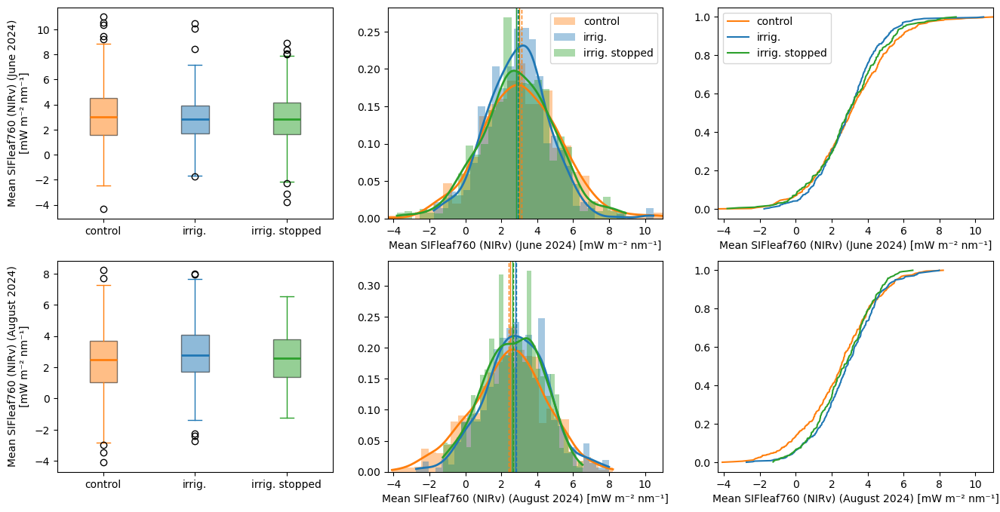


=== SIFleaf760 (FCVI) statistics ===

Mean SIFleaf760 (FCVI) (June 2024):
  control: weighted mean = 2.916e+00
  irrig.: weighted mean = 2.759e+00
  irrig. stopped: weighted mean = 2.773e+00

Mean SIFleaf760 (FCVI) (August 2024):
  control: weighted mean = 2.242e+00
  irrig.: weighted mean = 2.742e+00
  irrig. stopped: weighted mean = 2.496e+00


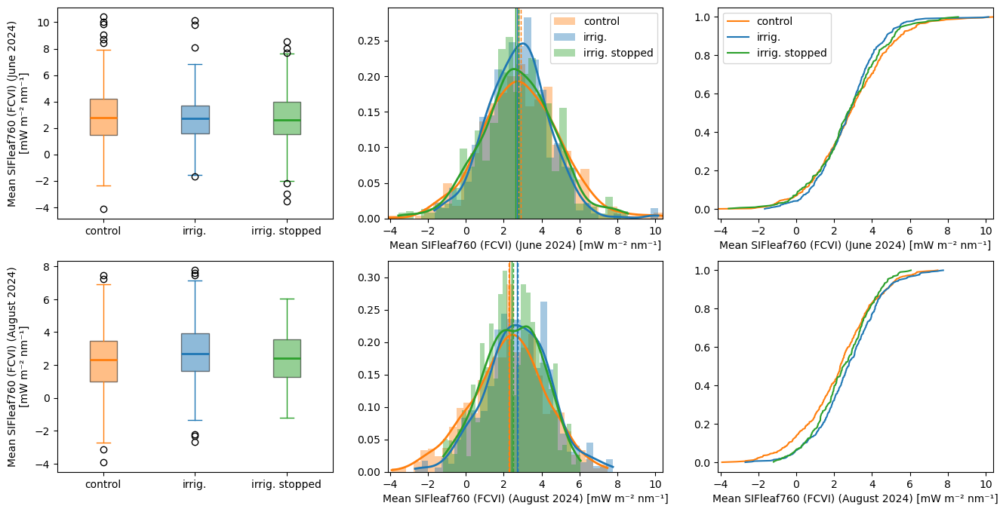


=== SIFleaf760 (saR2F) statistics ===

Mean SIFleaf760 (saR2F) (June 2024):
  control: weighted mean = 2.657e+00
  irrig.: weighted mean = 2.529e+00
  irrig. stopped: weighted mean = 2.535e+00

Mean SIFleaf760 (saR2F) (August 2024):
  control: weighted mean = 2.020e+00
  irrig.: weighted mean = 2.524e+00
  irrig. stopped: weighted mean = 2.269e+00


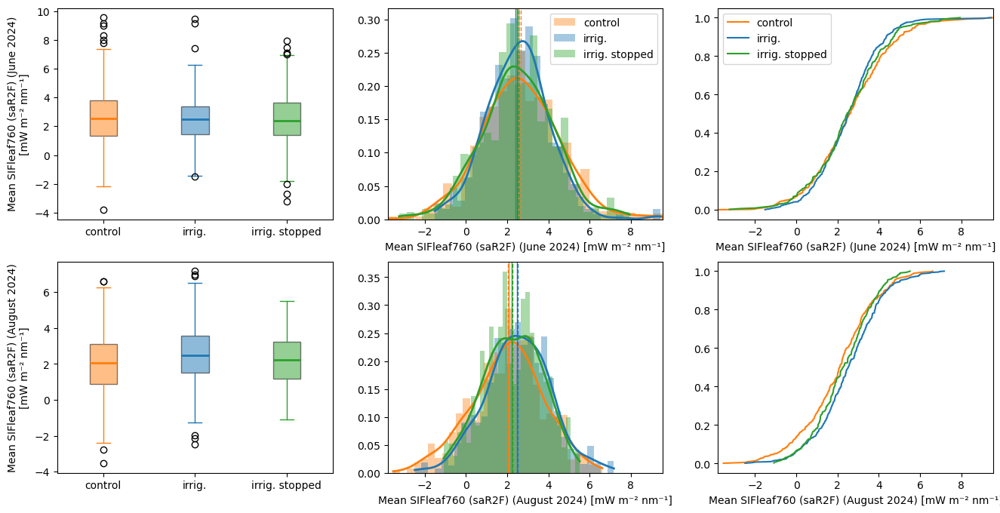

In [61]:
# SIF760leaf statistics
metrics = [
    ("SIFleaf760 (NIRv)",  sifleaf760_nirv_june_mean,  sifleaf760_nirv_aug_mean),
    ("SIFleaf760 (FCVI)",  sifleaf760_fcvi_june_mean,  sifleaf760_fcvi_aug_mean),
    ("SIFleaf760 (saR2F)", sifleaf760_saR2F_june_mean, sifleaf760_saR2F_aug_mean),
]

for metric, june, aug in metrics:
    datasets_norm = [
        (june, f"Mean {metric} (June 2024)"),
        (aug,  f"Mean {metric} (August 2024)"),
    ]
    print(f"\n=== {metric} statistics ===")
    plot_weighted_sif_stats_full(datasets_norm, crowns, treatments, colors, treatment_labels, unit_label="mW m⁻² nm⁻¹")

### Plots of FQE760


=== FQE760 (NIRv) map ===


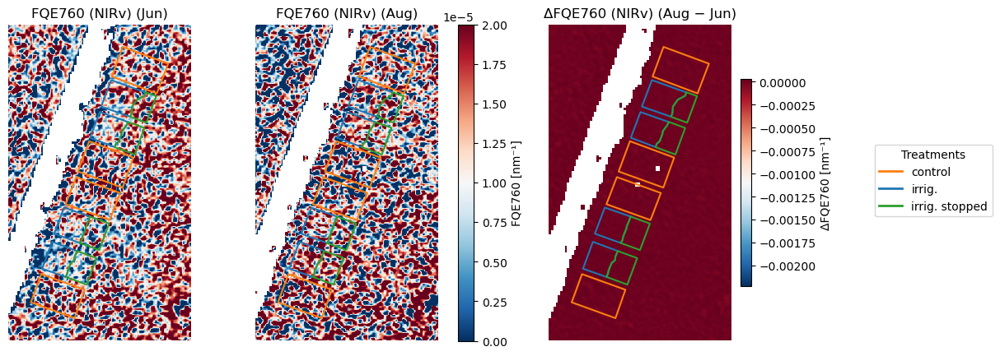


=== FQE760 (FCVI) map ===


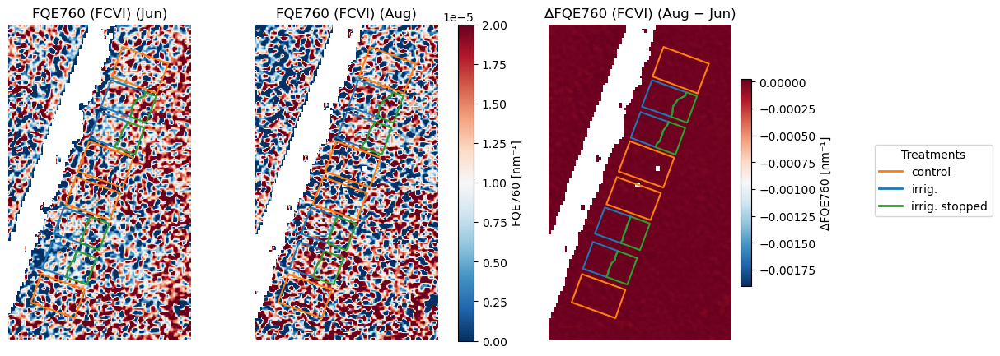


=== FQE760 (saR2F) map ===


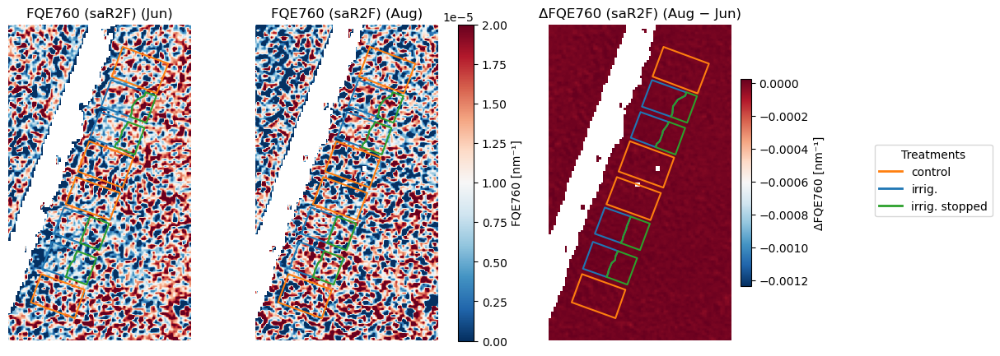

In [62]:
# --- Map metrics to their data and plot parameters ---
metrics_to_plot = {
    "FQE760 (NIRv)": {
        "june": FQE760_nirv_june_mean,
        "aug": FQE760_nirv_aug_mean,
        "vmin": 0,
        "vmax": 0.00002,
        "value_label": "FQE760 [nm⁻¹]"
    },
    "FQE760 (FCVI)": {
        "june": FQE760_fcvi_june_mean,
        "aug": FQE760_fcvi_aug_mean,
        "vmin": 0,
        "vmax": 0.00002,
        "value_label": "FQE760 [nm⁻¹]"
    },
    "FQE760 (saR2F)": {
        "june": FQE760_saR2F_june_mean,
        "aug": FQE760_saR2F_aug_mean,
        "vmin": 0,
        "vmax": 0.00002,
        "value_label": "FQE760 [nm⁻¹]"
    },
}

# --- Loop over metrics and plot ---
for metric_name, params in metrics_to_plot.items():
    print(f"\n=== {metric_name} map ===")
    plot_monthly_comparison(
        params["june"],
        params["aug"],
        treatments,
        treatment_areas,
        treatment_color_map,
        transform,
        xmin_pix, xmax_pix, ymin_pix, ymax_pix,
        vmin=params.get("vmin", None),
        vmax=params.get("vmax", None),
        titles=(f"{metric_name} (Jun)", f"{metric_name} (Aug)", f"Δ{metric_name} (Aug − Jun)"),
        value_label=params.get("value_label", metric_name),
        diff_label=f"Δ{params.get('value_label', metric_name)}",
        legend_labels=["control", "irrig.", "irrig. stopped"],
    )


=== FQE (NIRv) statistics ===

Mean FQE (NIRv) (June 2024):
  control: weighted mean = 1.246e-05
  irrig.: weighted mean = 1.147e-05
  irrig. stopped: weighted mean = 1.168e-05

Mean FQE (NIRv) (August 2024):
  control: weighted mean = 1.255e-05
  irrig.: weighted mean = 1.360e-05
  irrig. stopped: weighted mean = 1.332e-05


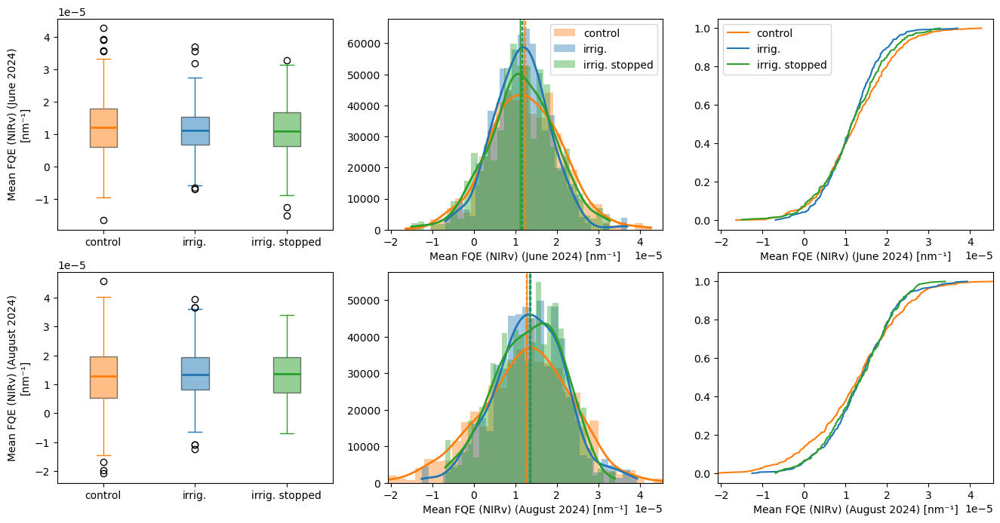


=== FQE (FCVI) statistics ===

Mean FQE (FCVI) (June 2024):
  control: weighted mean = 1.166e-05
  irrig.: weighted mean = 1.082e-05
  irrig. stopped: weighted mean = 1.097e-05

Mean FQE (FCVI) (August 2024):
  control: weighted mean = 1.172e-05
  irrig.: weighted mean = 1.311e-05
  irrig. stopped: weighted mean = 1.259e-05


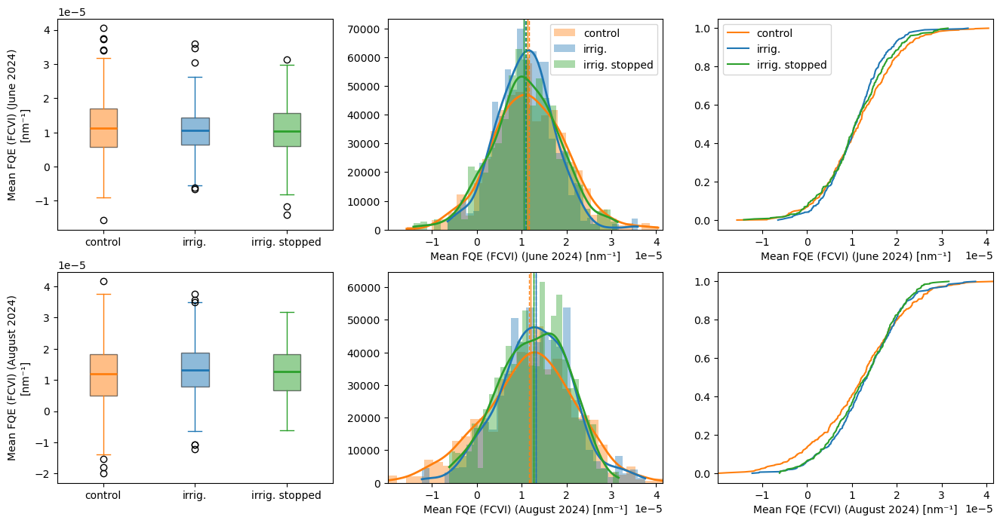


=== FQE (saR2F) statistics ===

Mean FQE (saR2F) (June 2024):
  control: weighted mean = 1.062e-05
  irrig.: weighted mean = 9.912e-06
  irrig. stopped: weighted mean = 1.003e-05

Mean FQE (saR2F) (August 2024):
  control: weighted mean = 1.055e-05
  irrig.: weighted mean = 1.207e-05
  irrig. stopped: weighted mean = 1.143e-05


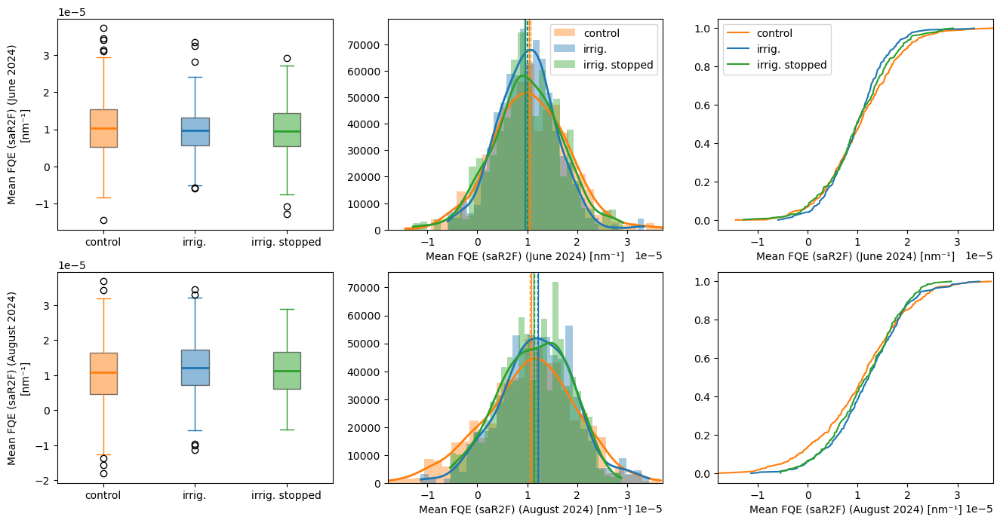

In [63]:
# SIF760leaf statistics
metrics = [
    ("FQE (NIRv)",  FQE760_nirv_june_mean,  FQE760_nirv_aug_mean),
    ("FQE (FCVI)",  FQE760_fcvi_june_mean,  FQE760_fcvi_aug_mean),
    ("FQE (saR2F)", FQE760_saR2F_june_mean, FQE760_saR2F_aug_mean),
]

for metric, june, aug in metrics:
    datasets_norm = [
        (june, f"Mean {metric} (June 2024)"),
        (aug,  f"Mean {metric} (August 2024)"),
    ]
    print(f"\n=== {metric} statistics ===")
    plot_weighted_sif_stats_full(datasets_norm, crowns, treatments, colors, treatment_labels, unit_label="nm⁻¹")

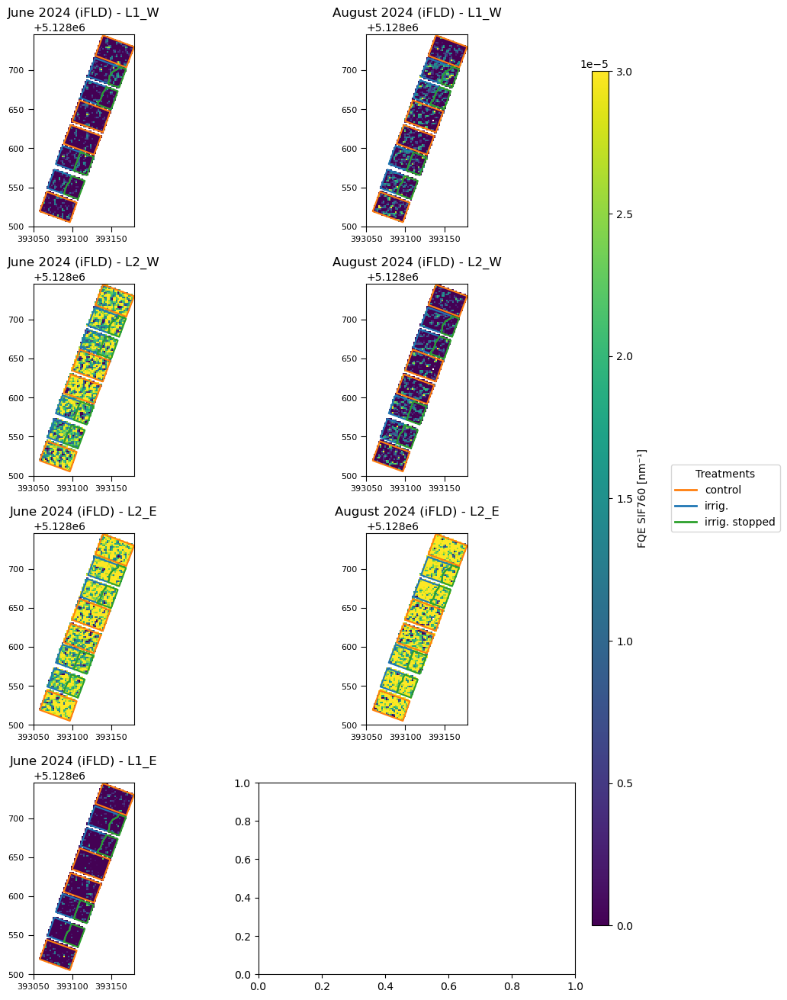

In [64]:
# Plot FQE
FQE760_saR2F_june_clipped = clip_rasters_to_treatment(FQE760_saR2F_june, treatment_areas)
FQE760_saR2F_aug_clipped  = clip_rasters_to_treatment(FQE760_saR2F_aug, treatment_areas)

plot_sif_overview(
    FQE760_saR2F_june_clipped, 
    FQE760_saR2F_aug_clipped,
    treatments, treatment_areas, treatment_color_map,
    vmin=0, vmax=3e-5,   
    legend_labels=treatment_labels,
    tick_interval=50,
    legend_unit="FQE SIF760 [nm⁻¹]"
)